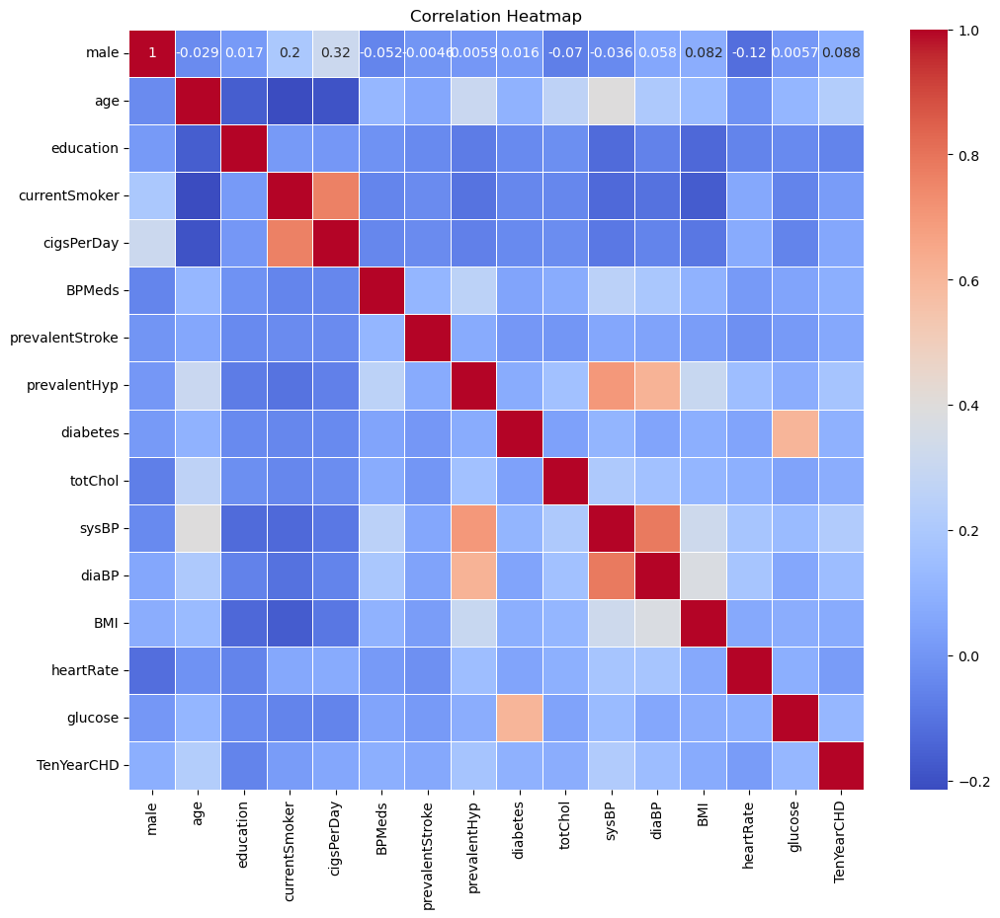

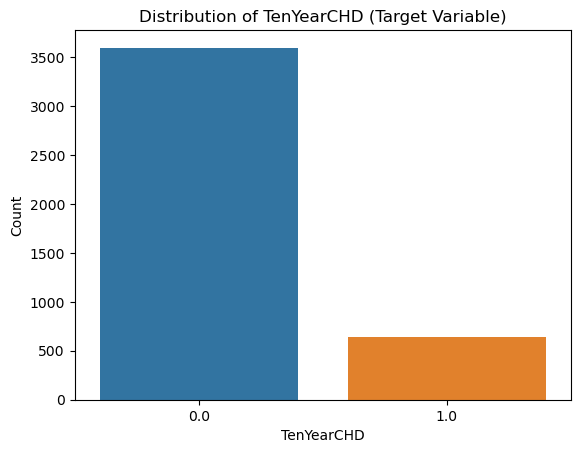

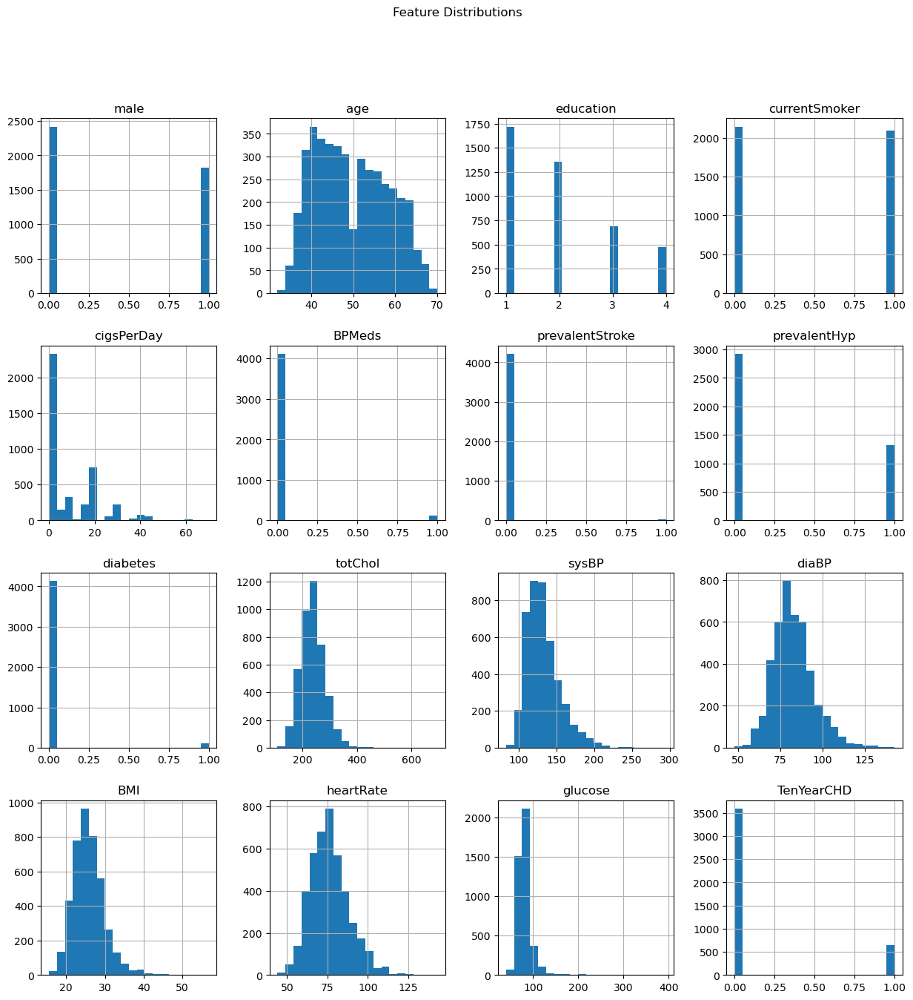

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

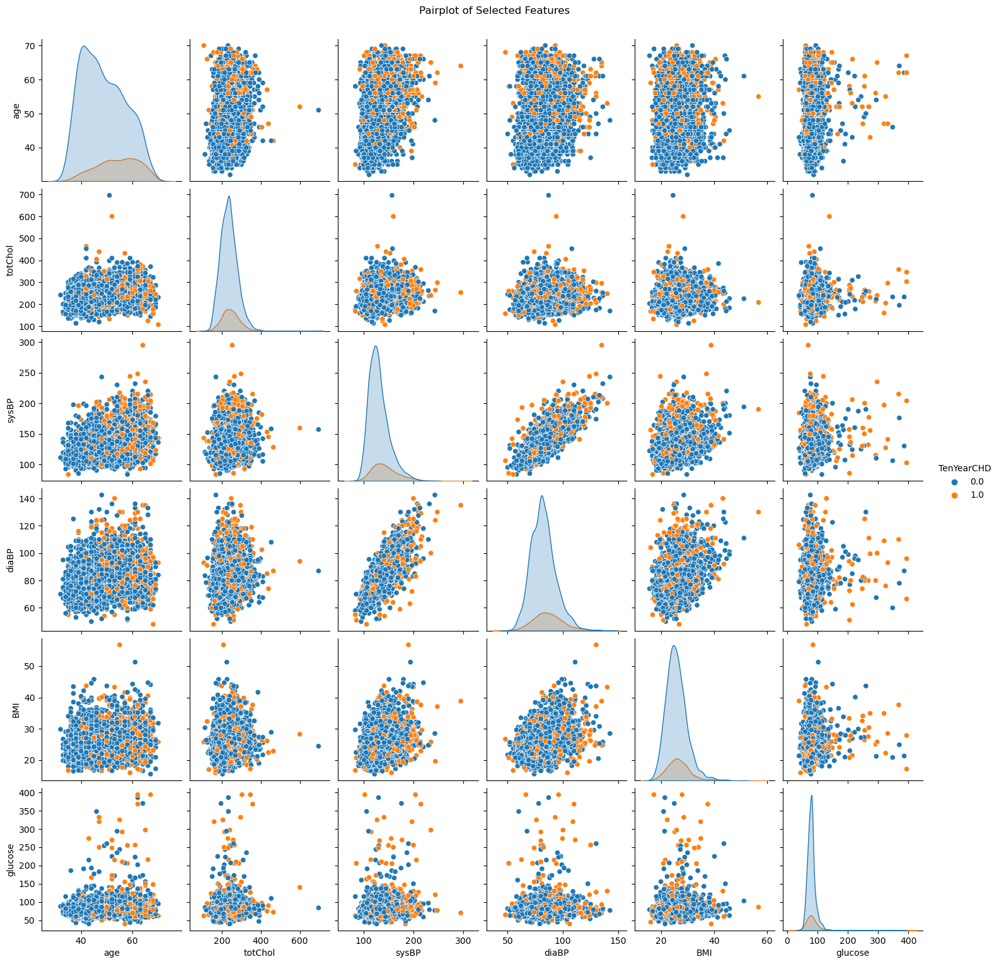


Tuning hyperparameters for Logistic Regression...
Best parameters for Logistic Regression: {'C': 0.1, 'solver': 'lbfgs'}

Tuning hyperparameters for Random Forest...
Best parameters for Random Forest: {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 200}

Tuning hyperparameters for SVM...
Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Tuning hyperparameters for KNN...
Best parameters for KNN: {'n_neighbors': 5, 'weights': 'distance'}

Tuning hyperparameters for Naive Bayes...

Tuning hyperparameters for Decision Tree...
Best parameters for Decision Tree: {'max_depth': 10, 'min_samples_split': 10}

Model: Logistic Regression
              precision    recall  f1-score   support

         0.0       0.68      0.65      0.66       745
         1.0       0.64      0.67      0.65       694

    accuracy                           0.66      1439
   macro avg       0.66      0.66      0.66      1439
weighted avg       0.66      0.66      0.66      1439

ROC AUC Score: 0.72145523

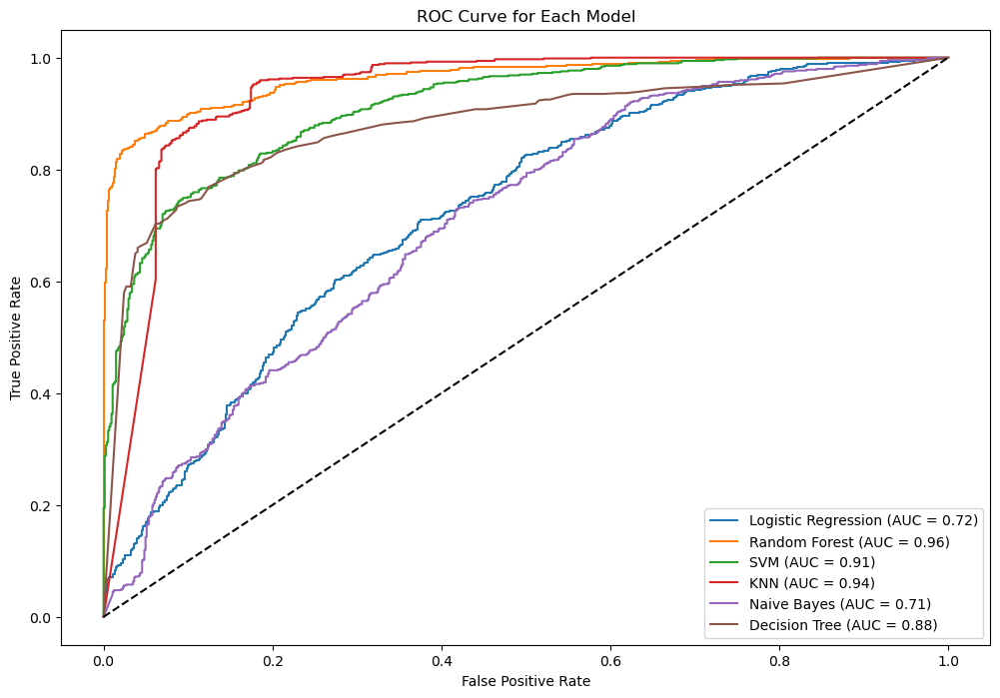

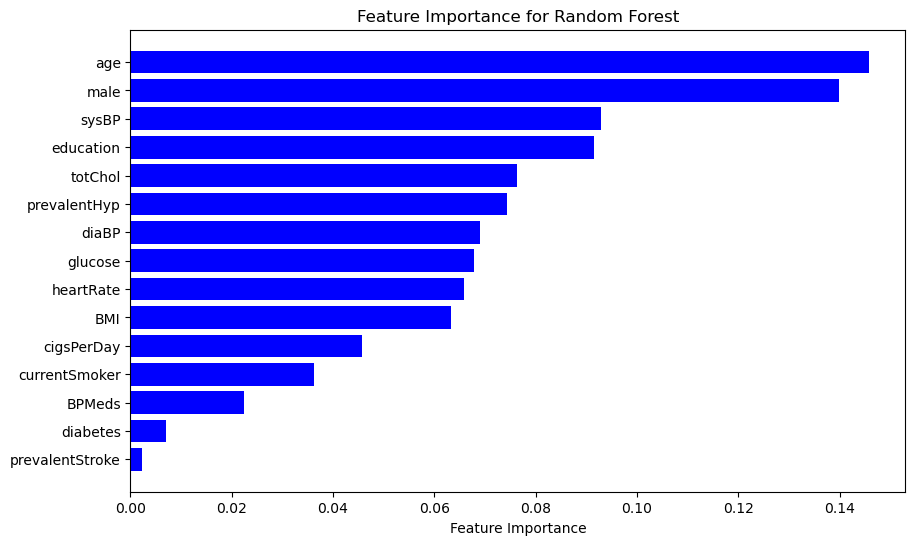

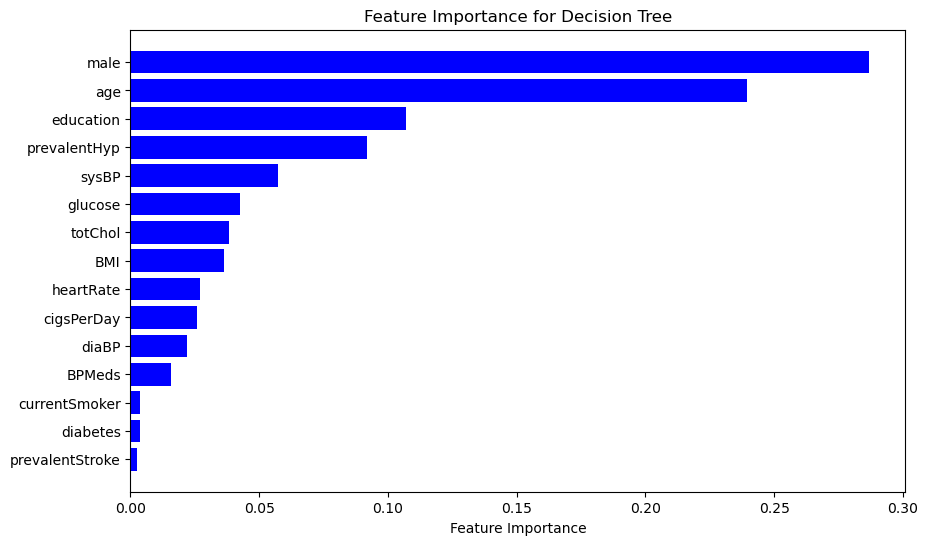


The best model is: Random Forest with AUC Score: 0.9641606870007543

Explaining the best model: Random Forest


 99%|===================| 2856/2878 [01:24<00:00]        

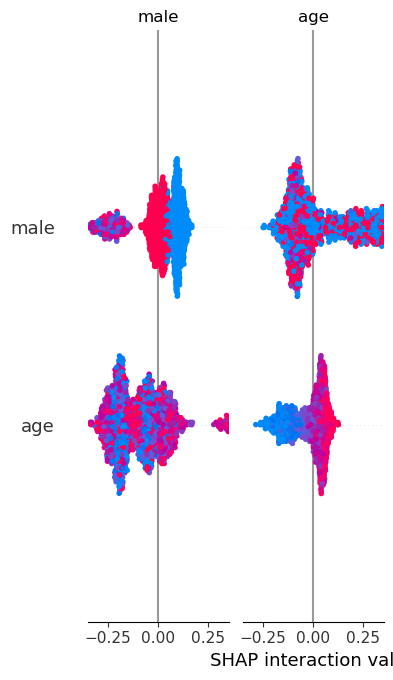

TypeError: dependence_legacy() got multiple values for argument 'shap_values'

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc, confusion_matrix
from imblearn.over_sampling import SMOTE
import shap

# Step 1: Load the dataset
df = pd.read_csv('framingham.csv')

# Step 2: Data Preprocessing
# Handling missing values
imputer = SimpleImputer(strategy='mean')
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Encoding categorical variables
le = LabelEncoder()
for column in df_imputed.select_dtypes(include='object').columns:
    df_imputed[column] = le.fit_transform(df_imputed[column])

# Step 3: Feature Engineering
X = df_imputed.drop(columns=['TenYearCHD'])
y = df_imputed['TenYearCHD']

# Step 4: Balancing the Dataset
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 5: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 6: Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 7: Data Visualization
# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(df_imputed.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

# Distribution of target variable
sns.countplot(x='TenYearCHD', data=df_imputed)
plt.title('Distribution of TenYearCHD (Target Variable)')
plt.xlabel('TenYearCHD')
plt.ylabel('Count')
plt.show()

# Feature distributions
df_imputed.hist(figsize=(15, 15), bins=20)
plt.suptitle('Feature Distributions')
plt.show()

# Pairplot of selected features
selected_features = ['age', 'totChol', 'sysBP', 'diaBP', 'BMI', 'glucose', 'TenYearCHD']
sns.pairplot(df_imputed[selected_features], hue='TenYearCHD', diag_kind='kde')
plt.suptitle('Pairplot of Selected Features', y=1.02)
plt.show()

# Step 8: Model Training and Hyperparameter Tuning
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(probability=True),
    'KNN': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'Decision Tree': DecisionTreeClassifier()
}

param_grids = {
    'Logistic Regression': {'C': [0.1, 1, 10, 100], 'solver': ['liblinear', 'lbfgs']},
    'Random Forest': {'n_estimators': [100, 200, 300], 'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]},
    'SVM': {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']},
    'KNN': {'n_neighbors': [3, 5, 7, 9], 'weights': ['uniform', 'distance']},
    'Decision Tree': {'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]}
}

best_models = {}

for model_name, model in models.items():
    print(f"\nTuning hyperparameters for {model_name}...")
    if model_name in param_grids:
        grid_search = GridSearchCV(model, param_grids[model_name], cv=5, scoring='roc_auc', n_jobs=-1)
        grid_search.fit(X_train_scaled, y_train)
        best_model = grid_search.best_estimator_
        best_models[model_name] = best_model
        print(f"Best parameters for {model_name}: {grid_search.best_params_}")
    else:
        model.fit(X_train_scaled, y_train)
        best_models[model_name] = model

# Step 9: Model Evaluation
feature_importances = {}
model_auc_scores = {}

plt.figure(figsize=(12, 8))
for model_name, model in best_models.items():
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, 'predict_proba') else None
    
    print(f"\nModel: {model_name}")
    print(classification_report(y_test, y_pred))
    if y_pred_proba is not None:
        auc_score = roc_auc_score(y_test, y_pred_proba)
        model_auc_scores[model_name] = auc_score
        print(f"ROC AUC Score: {auc_score}")
        
        # Plotting ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc_score:.2f})')
    
    # Store feature importances for tree-based models
    if model_name in ['Random Forest', 'Decision Tree']:
        feature_importances[model_name] = model.feature_importances_

# Plotting the ROC curves for all models
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Model')
plt.legend(loc='lower right')
plt.show()

# Step 10: Feature Importance Visualization
for model_name, importances in feature_importances.items():
    plt.figure(figsize=(10, 6))
    sorted_idx = np.argsort(importances)
    plt.barh(X.columns[sorted_idx], importances[sorted_idx], color='b', align='center')
    plt.xlabel('Feature Importance')
    plt.title(f'Feature Importance for {model_name}')
    plt.show()

# Step 11: Model Selection
# Select the best model based on the highest AUC score
best_model_name = max(model_auc_scores, key=model_auc_scores.get)
best_model = best_models[best_model_name]
print(f"\nThe best model is: {best_model_name} with AUC Score: {model_auc_scores[best_model_name]}")

# Step 12: Model Interpretability using SHAP
print(f"\nExplaining the best model: {best_model_name}")
if best_model_name in ['Random Forest', 'Logistic Regression', 'Decision Tree']:
    explainer = shap.Explainer(best_model, X_train_scaled)
    shap_values = explainer(X_test_scaled, check_additivity=False)
    
    # Summary plot
    shap.summary_plot(shap_values, X_test, feature_names=X.columns)
    
    # Dependence plot for the top feature
    top_feature = np.argmax(np.abs(shap_values.values).mean(axis=0))
    shap.dependence_plot(top_feature, X_test, shap_values=shap_values, feature_names=X.columns)
    
    # Visualize SHAP values for individual predictions
    for i in range(3):  # Visualizing SHAP values for the first three test samples
        shap.force_plot(explainer.expected_value, shap_values[i].values, X_test.iloc[i], feature_names=X.columns, matplotlib=True)
else:
    print(f"SHAP is not supported for the model {best_model_name}.")

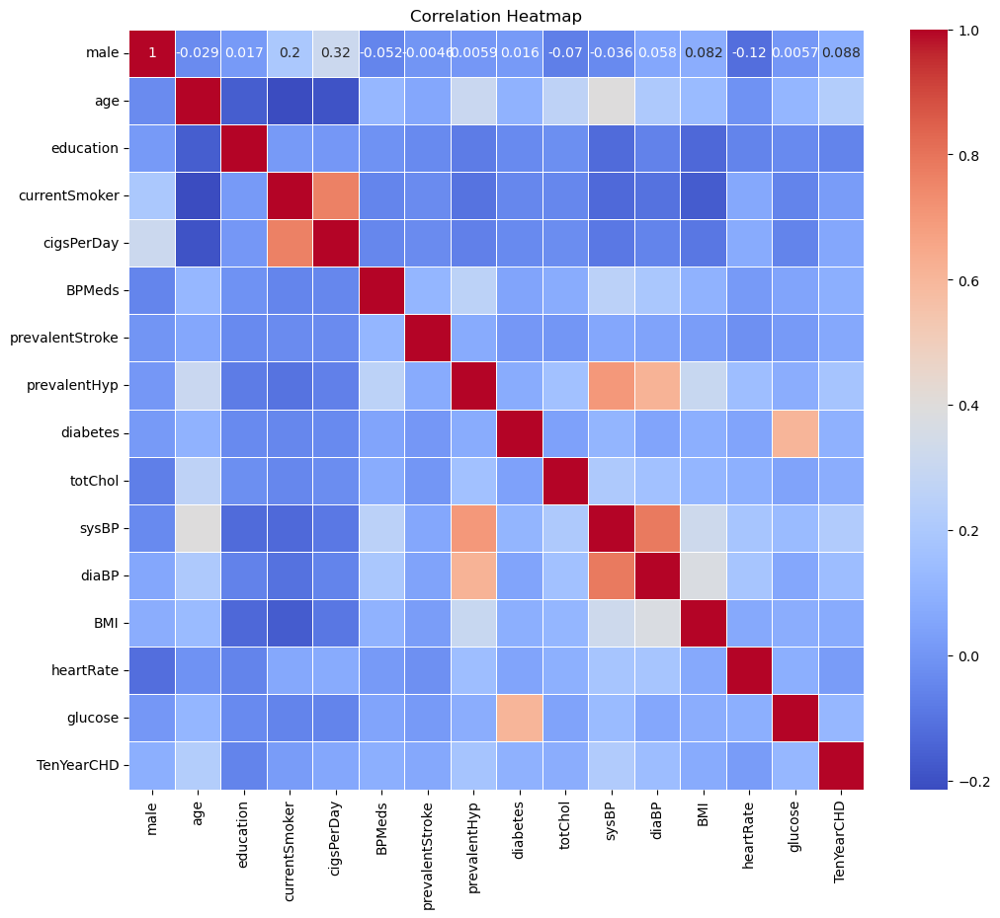

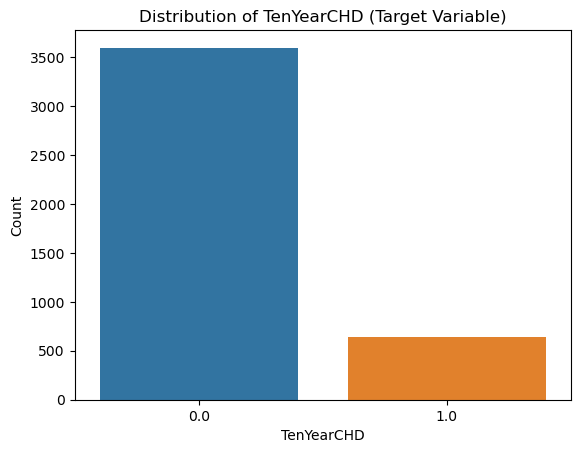

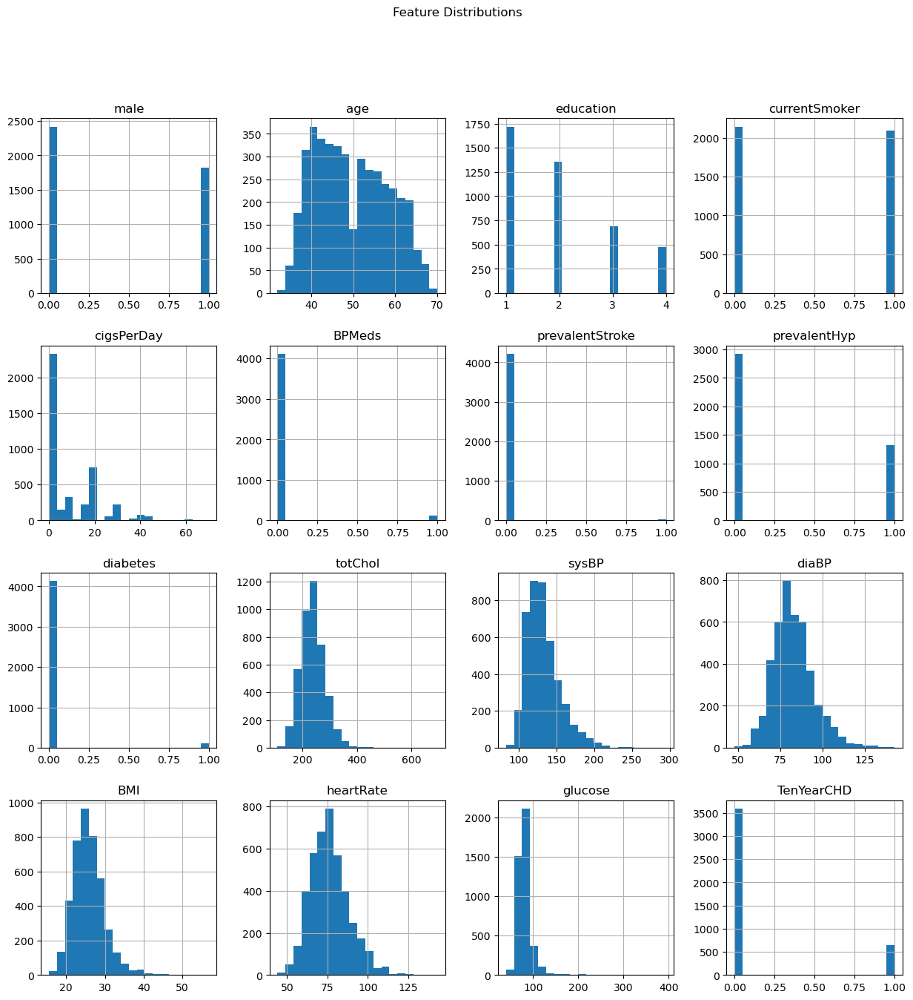

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

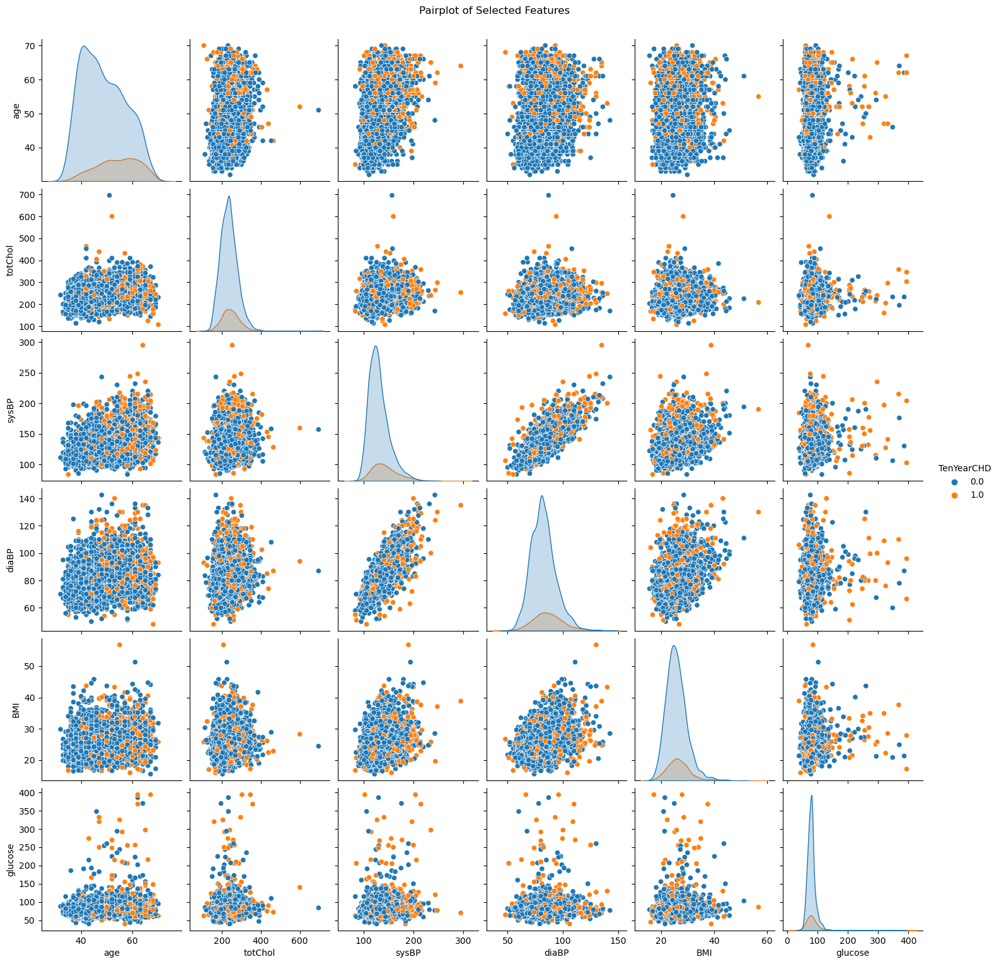


Tuning hyperparameters for Logistic Regression...
Best parameters for Logistic Regression: {'C': 0.1, 'solver': 'lbfgs'}

Tuning hyperparameters for Random Forest...
Best parameters for Random Forest: {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 200}

Tuning hyperparameters for SVM...
Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Tuning hyperparameters for KNN...
Best parameters for KNN: {'n_neighbors': 5, 'weights': 'distance'}

Tuning hyperparameters for Naive Bayes...

Tuning hyperparameters for Decision Tree...
Best parameters for Decision Tree: {'max_depth': 10, 'min_samples_split': 10}

Model: Logistic Regression
Accuracy: 0.66
              precision    recall  f1-score   support

         0.0       0.68      0.64      0.66       745
         1.0       0.64      0.67      0.65       694

    accuracy                           0.66      1439
   macro avg       0.66      0.66      0.66      1439
weighted avg       0.66      0.66      0.66      1439

ROC AUC Sc

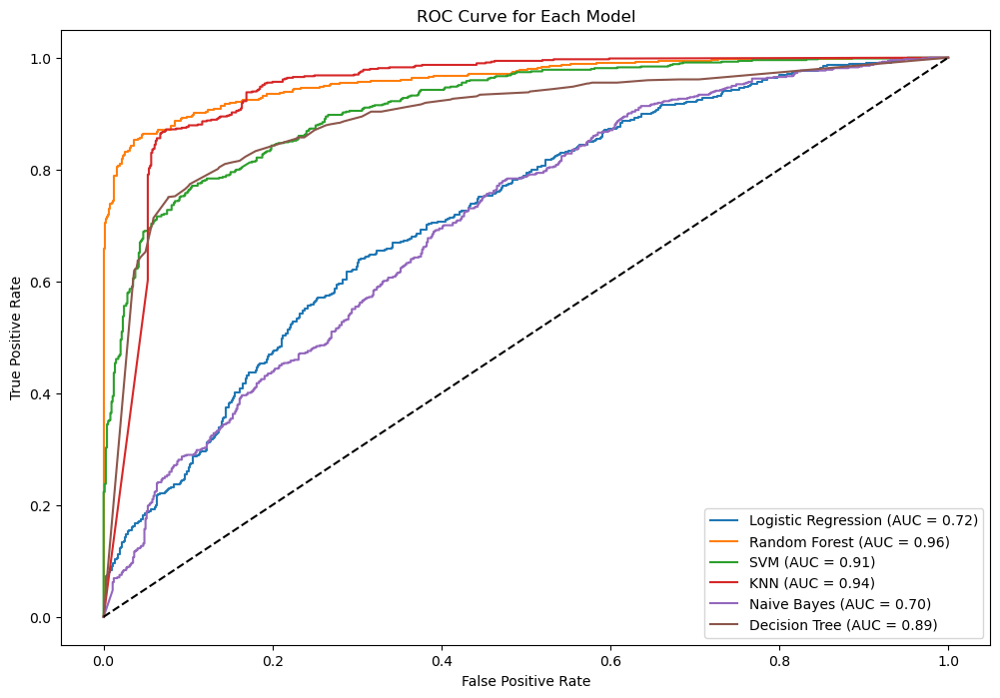

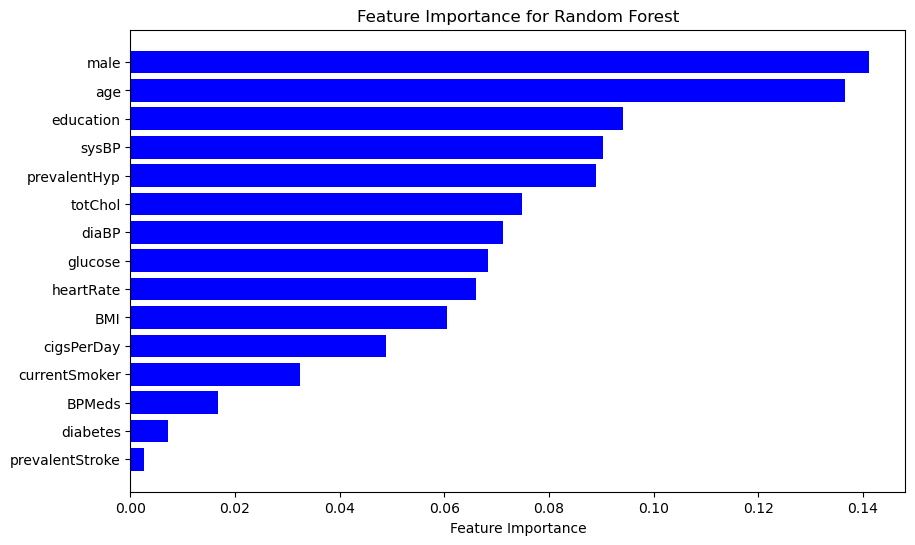

Top features for Random Forest:male            0.141105
age             0.136619
education       0.094253
sysBP           0.090265
prevalentHyp    0.088985
dtype: float64


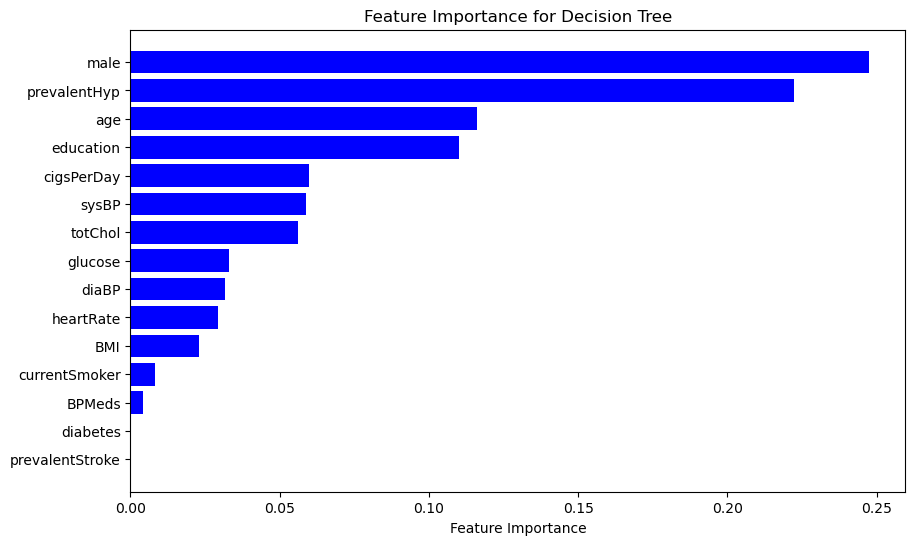

Top features for Decision Tree:male            0.247311
prevalentHyp    0.222237
age             0.116260
education       0.110020
cigsPerDay      0.059844
dtype: float64


In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE
import shap

# Step 1: Load the dataset
df = pd.read_csv('framingham.csv')

# Step 2: Data Preprocessing
# Handling missing values
imputer = SimpleImputer(strategy='mean')
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Encoding categorical variables
le = LabelEncoder()
for column in df_imputed.select_dtypes(include='object').columns:
    df_imputed[column] = le.fit_transform(df_imputed[column])

# Step 3: Feature Engineering
X = df_imputed.drop(columns=['TenYearCHD'])
y = df_imputed['TenYearCHD']

# Step 4: Balancing the Dataset
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 5: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 6: Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 7: Data Visualization
# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(df_imputed.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

# Distribution of target variable
sns.countplot(x='TenYearCHD', data=df_imputed)
plt.title('Distribution of TenYearCHD (Target Variable)')
plt.xlabel('TenYearCHD')
plt.ylabel('Count')
plt.show()

# Feature distributions
df_imputed.hist(figsize=(15, 15), bins=20)
plt.suptitle('Feature Distributions')
plt.show()

# Pairplot of selected features
selected_features = ['age', 'totChol', 'sysBP', 'diaBP', 'BMI', 'glucose', 'TenYearCHD']
sns.pairplot(df_imputed[selected_features], hue='TenYearCHD', diag_kind='kde')
plt.suptitle('Pairplot of Selected Features', y=1.02)
plt.show()

# Step 8: Model Training and Hyperparameter Tuning
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(probability=True),
    'KNN': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'Decision Tree': DecisionTreeClassifier()
}

param_grids = {
    'Logistic Regression': {'C': [0.1, 1, 10, 100], 'solver': ['liblinear', 'lbfgs']},
    'Random Forest': {'n_estimators': [100, 200, 300], 'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]},
    'SVM': {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']},
    'KNN': {'n_neighbors': [3, 5, 7, 9], 'weights': ['uniform', 'distance']},
    'Decision Tree': {'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]}
}

best_models = {}

for model_name, model in models.items():
    print(f"\nTuning hyperparameters for {model_name}...")
    if model_name in param_grids:
        grid_search = GridSearchCV(model, param_grids[model_name], cv=5, scoring='roc_auc', n_jobs=-1)
        grid_search.fit(X_train_scaled, y_train)
        best_model = grid_search.best_estimator_
        best_models[model_name] = best_model
        print(f"Best parameters for {model_name}: {grid_search.best_params_}")
    else:
        model.fit(X_train_scaled, y_train)
        best_models[model_name] = model

# Step 9: Model Evaluation
feature_importances = {}
model_auc_scores = {}
model_accuracies = {}

plt.figure(figsize=(12, 8))
for model_name, model in best_models.items():
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, 'predict_proba') else None
    accuracy = accuracy_score(y_test, y_pred)
    model_accuracies[model_name] = accuracy
    
    print(f"\nModel: {model_name}")
    print(f"Accuracy: {accuracy:.2f}")
    print(classification_report(y_test, y_pred))
    if y_pred_proba is not None:
        auc_score = roc_auc_score(y_test, y_pred_proba)
        model_auc_scores[model_name] = auc_score
        print(f"ROC AUC Score: {auc_score}")
        
        # Plotting ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc_score:.2f})')
    
    # Store feature importances for tree-based models
    if model_name in ['Random Forest', 'Decision Tree']:
        feature_importances[model_name] = model.feature_importances_

# Plotting the ROC curves for all models
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Model')
plt.legend(loc='lower right')
plt.show()

# Step 10: Feature Importance Visualization
for model_name, importances in feature_importances.items():
    plt.figure(figsize=(10, 6))
    sorted_idx = np.argsort(importances)
    plt.barh(X.columns[sorted_idx], importances[sorted_idx], color='b', align='center')
    plt.xlabel('Feature Importance')
    plt.title(f'Feature Importance for {model_name}')
    plt.show()

    # Print top features
    top_features = pd.Series(importances, index=X.columns).sort_values(ascending=False)
    print(f"Top features for {model_name}:{top_features.head(5)}")

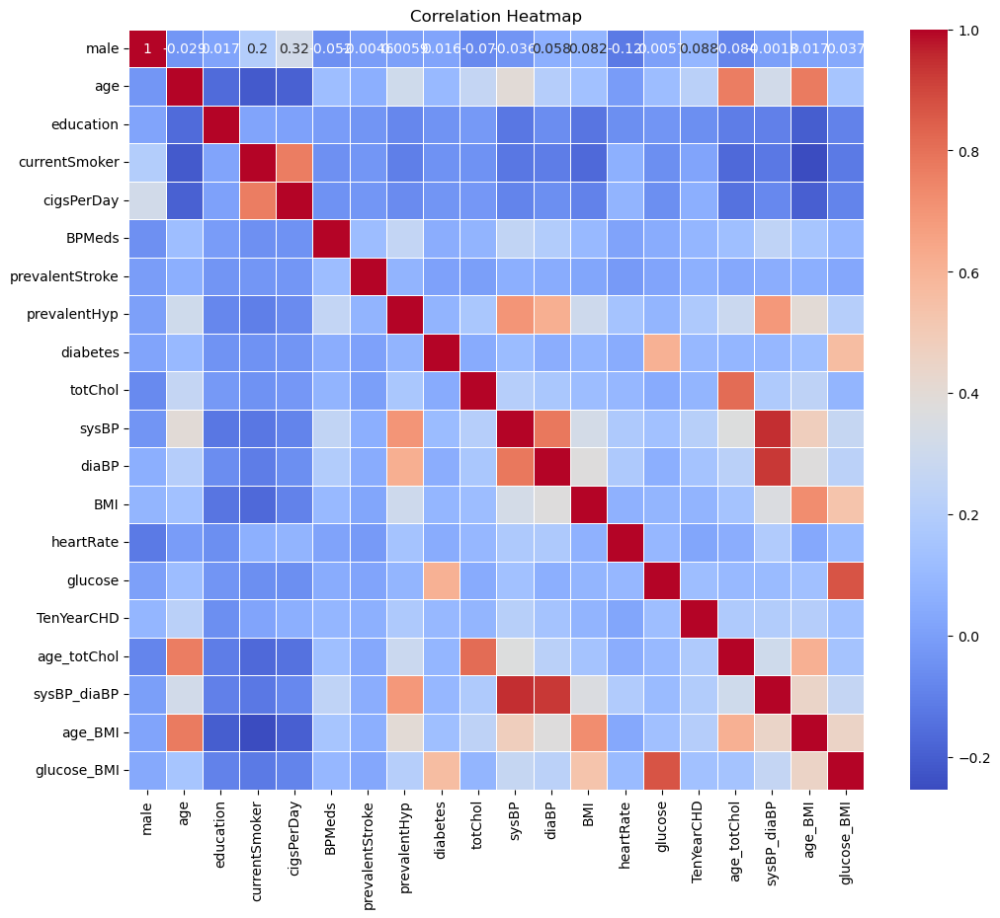

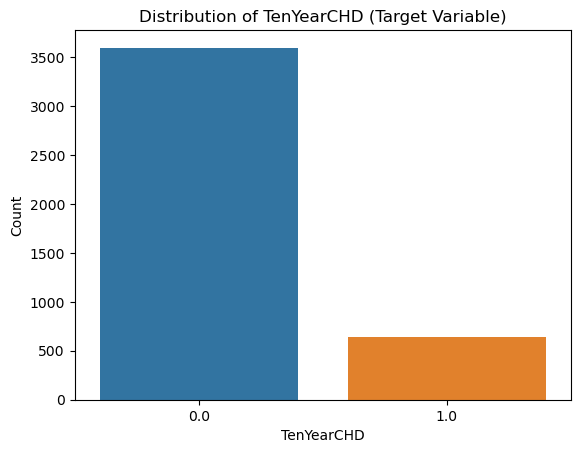

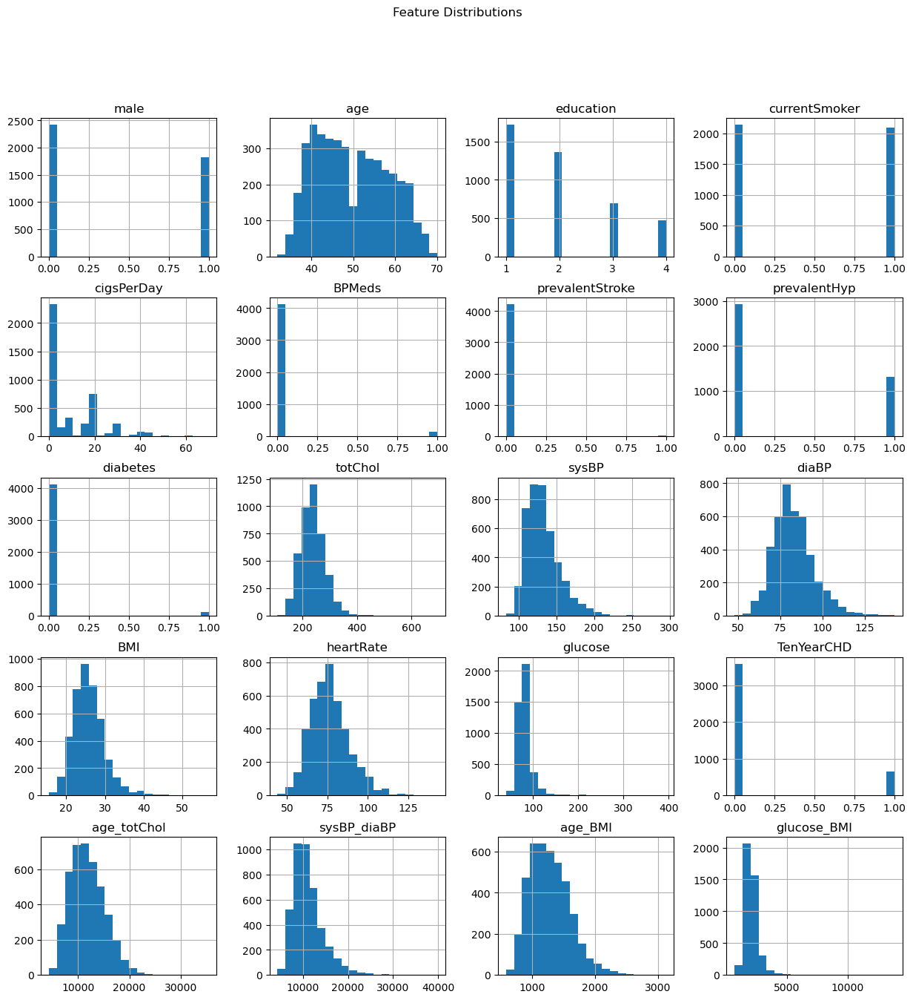

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

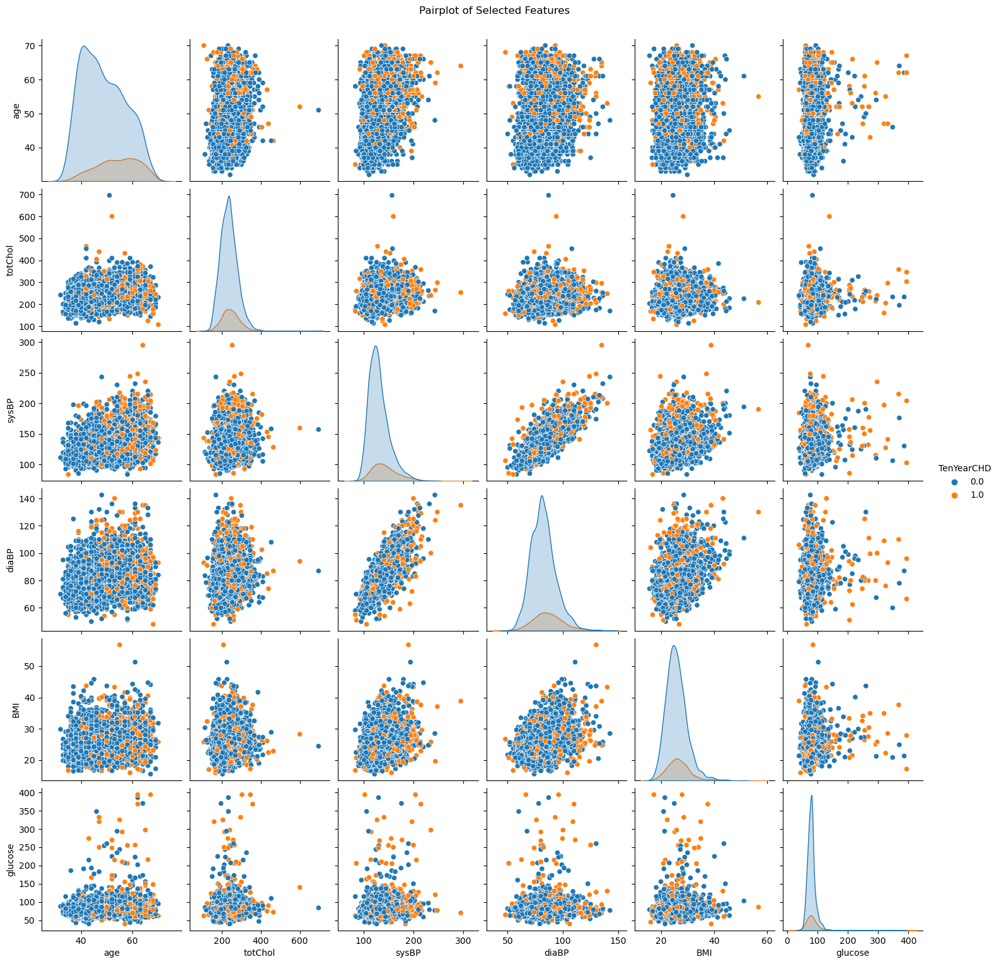


Tuning hyperparameters for Logistic Regression...
Best parameters for Logistic Regression: {'C': 10, 'solver': 'lbfgs'}

Tuning hyperparameters for Random Forest...
Best parameters for Random Forest: {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 300}

Tuning hyperparameters for SVM...
Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Tuning hyperparameters for KNN...
Best parameters for KNN: {'n_neighbors': 5, 'weights': 'distance'}

Tuning hyperparameters for Naive Bayes...

Tuning hyperparameters for Decision Tree...
Best parameters for Decision Tree: {'max_depth': 10, 'min_samples_split': 5}

Model: Logistic Regression
Accuracy: 0.67
              precision    recall  f1-score   support

         0.0       0.70      0.64      0.67       745
         1.0       0.64      0.70      0.67       694

    accuracy                           0.67      1439
   macro avg       0.67      0.67      0.67      1439
weighted avg       0.67      0.67      0.67      1439

ROC AUC Scor

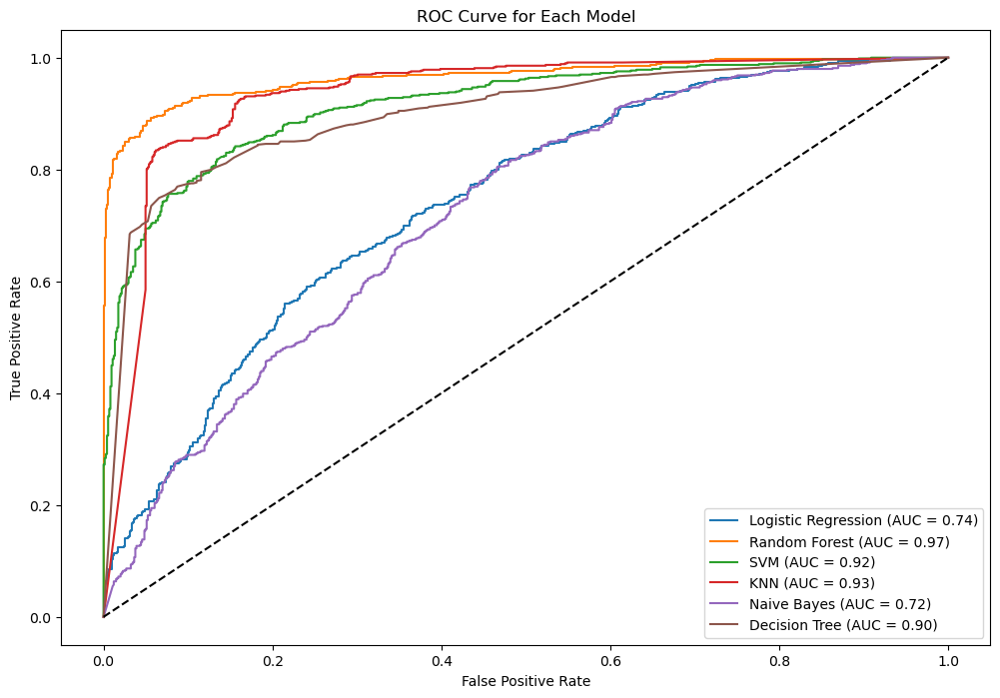

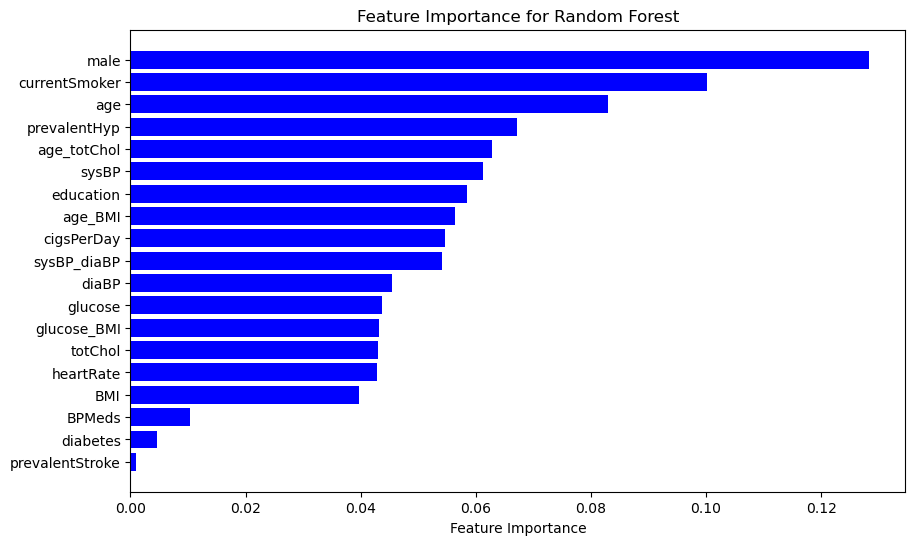

Top features for Random Forest:male             0.128239
currentSmoker    0.100246
age              0.082883
prevalentHyp     0.067237
age_totChol      0.062793
dtype: float64


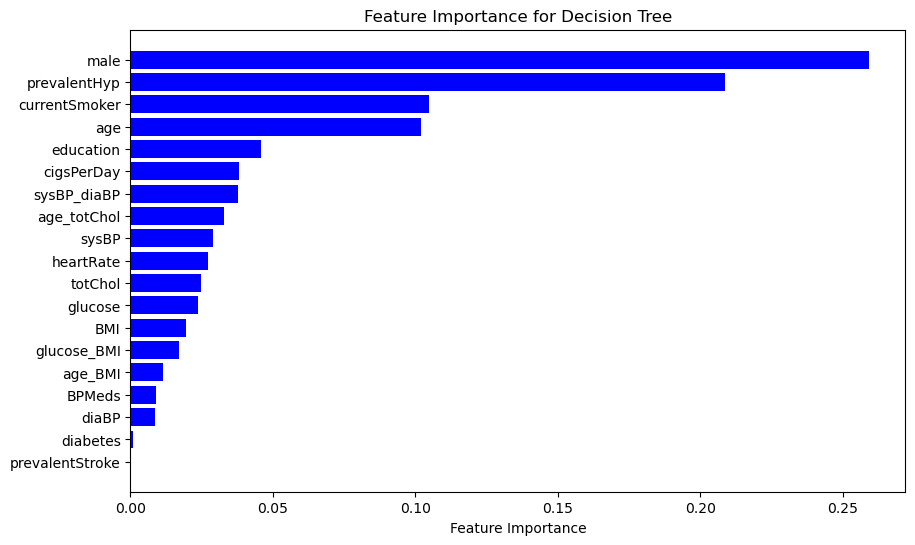

Top features for Decision Tree:male             0.259124
prevalentHyp     0.208674
currentSmoker    0.104711
age              0.102158
education        0.045931
dtype: float64

The best model is: Random Forest with AUC Score: 0.9656538305320773 and Accuracy: 0.92

Explaining the best model: Random Forest


100%|===================| 2877/2878 [02:07<00:00]        

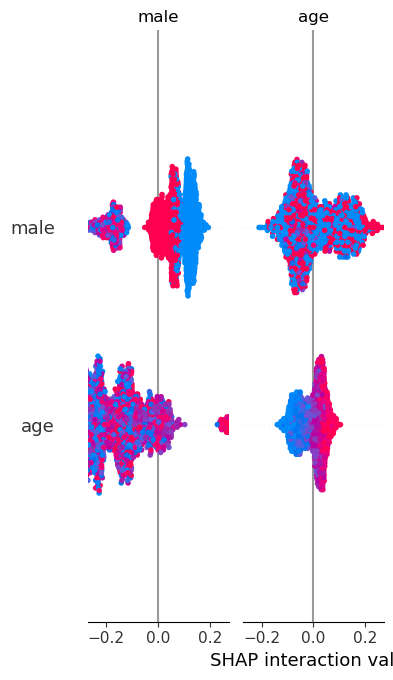

TypeError: dependence_legacy() got multiple values for argument 'shap_values'

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE
import shap

# Step 1: Load the dataset
df = pd.read_csv('framingham.csv')

# Step 2: Data Preprocessing
# Handling missing values
imputer = SimpleImputer(strategy='mean')
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Encoding categorical variables
le = LabelEncoder()
for column in df_imputed.select_dtypes(include='object').columns:
    df_imputed[column] = le.fit_transform(df_imputed[column])

# Step 3: Feature Engineering
# Creating interaction features
df_imputed['age_totChol'] = df_imputed['age'] * df_imputed['totChol']
df_imputed['sysBP_diaBP'] = df_imputed['sysBP'] * df_imputed['diaBP']
df_imputed['age_BMI'] = df_imputed['age'] * df_imputed['BMI']
df_imputed['glucose_BMI'] = df_imputed['glucose'] * df_imputed['BMI']

X = df_imputed.drop(columns=['TenYearCHD'])
y = df_imputed['TenYearCHD']

# Step 4: Balancing the Dataset
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 5: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 6: Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 7: Data Visualization
# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(df_imputed.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

# Distribution of target variable
sns.countplot(x='TenYearCHD', data=df_imputed)
plt.title('Distribution of TenYearCHD (Target Variable)')
plt.xlabel('TenYearCHD')
plt.ylabel('Count')
plt.show()

# Feature distributions
df_imputed.hist(figsize=(15, 15), bins=20)
plt.suptitle('Feature Distributions')
plt.show()

# Pairplot of selected features
selected_features = ['age', 'totChol', 'sysBP', 'diaBP', 'BMI', 'glucose', 'TenYearCHD']
sns.pairplot(df_imputed[selected_features], hue='TenYearCHD', diag_kind='kde')
plt.suptitle('Pairplot of Selected Features', y=1.02)
plt.show()

# Step 8: Model Training and Hyperparameter Tuning
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(probability=True),
    'KNN': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'Decision Tree': DecisionTreeClassifier()
}

param_grids = {
    'Logistic Regression': {'C': [0.1, 1, 10, 100], 'solver': ['liblinear', 'lbfgs']},
    'Random Forest': {'n_estimators': [100, 200, 300], 'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]},
    'SVM': {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']},
    'KNN': {'n_neighbors': [3, 5, 7, 9], 'weights': ['uniform', 'distance']},
    'Decision Tree': {'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]}
}

best_models = {}

for model_name, model in models.items():
    print(f"\nTuning hyperparameters for {model_name}...")
    if model_name in param_grids:
        grid_search = GridSearchCV(model, param_grids[model_name], cv=5, scoring='roc_auc', n_jobs=-1)
        grid_search.fit(X_train_scaled, y_train)
        best_model = grid_search.best_estimator_
        best_models[model_name] = best_model
        print(f"Best parameters for {model_name}: {grid_search.best_params_}")
    else:
        model.fit(X_train_scaled, y_train)
        best_models[model_name] = model

# Step 9: Model Evaluation
feature_importances = {}
model_auc_scores = {}
model_accuracies = {}

plt.figure(figsize=(12, 8))
for model_name, model in best_models.items():
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, 'predict_proba') else None
    accuracy = accuracy_score(y_test, y_pred)
    model_accuracies[model_name] = accuracy
    
    print(f"\nModel: {model_name}")
    print(f"Accuracy: {accuracy:.2f}")
    print(classification_report(y_test, y_pred))
    if y_pred_proba is not None:
        auc_score = roc_auc_score(y_test, y_pred_proba)
        model_auc_scores[model_name] = auc_score
        print(f"ROC AUC Score: {auc_score}")
        
        # Plotting ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc_score:.2f})')
    
    # Store feature importances for tree-based models
    if model_name in ['Random Forest', 'Decision Tree']:
        feature_importances[model_name] = model.feature_importances_

# Plotting the ROC curves for all models
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Model')
plt.legend(loc='lower right')
plt.show()

# Step 10: Feature Importance Visualization
for model_name, importances in feature_importances.items():
    plt.figure(figsize=(10, 6))
    sorted_idx = np.argsort(importances)
    plt.barh(X.columns[sorted_idx], importances[sorted_idx], color='b', align='center')
    plt.xlabel('Feature Importance')
    plt.title(f'Feature Importance for {model_name}')
    plt.show()

    # Print top features
    top_features = pd.Series(importances, index=X.columns).sort_values(ascending=False)
    print(f"Top features for {model_name}:{top_features.head(5)}")

# Step 11: Model Selection
# Select the best model based on the highest AUC score
best_model_name = max(model_auc_scores, key=model_auc_scores.get)
best_model = best_models[best_model_name]
print(f"\nThe best model is: {best_model_name} with AUC Score: {model_auc_scores[best_model_name]} and Accuracy: {model_accuracies[best_model_name]:.2f}")

# Step 12: Model Interpretability using SHAP
print(f"\nExplaining the best model: {best_model_name}")
if best_model_name in ['Random Forest', 'Logistic Regression', 'Decision Tree']:
    explainer = shap.Explainer(best_model, X_train_scaled)
    shap_values = explainer(X_test_scaled, check_additivity=False)
    
    # Summary plot
    shap.summary_plot(shap_values, X_test, feature_names=X.columns)
    
    # Dependence plot for the top feature
    top_feature = np.argmax(np.abs(shap_values.values).mean(axis=0))
    shap.dependence_plot(top_feature, X_test, shap_values=shap_values, feature_names=X.columns)
    
    # Visualize SHAP values for individual predictions
    for i in range(3):  # Visualizing SHAP values for the first three test samples
        shap.force_plot(explainer.expected_value, shap_values[i].values, X_test.iloc[i], feature_names=X.columns, matplotlib=True)
else:
    print(f"SHAP is not supported for the model {best_model_name}.")

In [21]:
for model_name, model in best_models.items():
    y_pred = model.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, y_pred)
    model_accuracies[model_name] = accuracy
    
    print(f"\nModel: {model_name}")
    print(f"Accuracy: {accuracy:.2f}")



Model: Logistic Regression
Accuracy: 0.67

Model: Random Forest
Accuracy: 0.92

Model: SVM
Accuracy: 0.84

Model: KNN
Accuracy: 0.83

Model: Naive Bayes
Accuracy: 0.62

Model: Decision Tree
Accuracy: 0.84


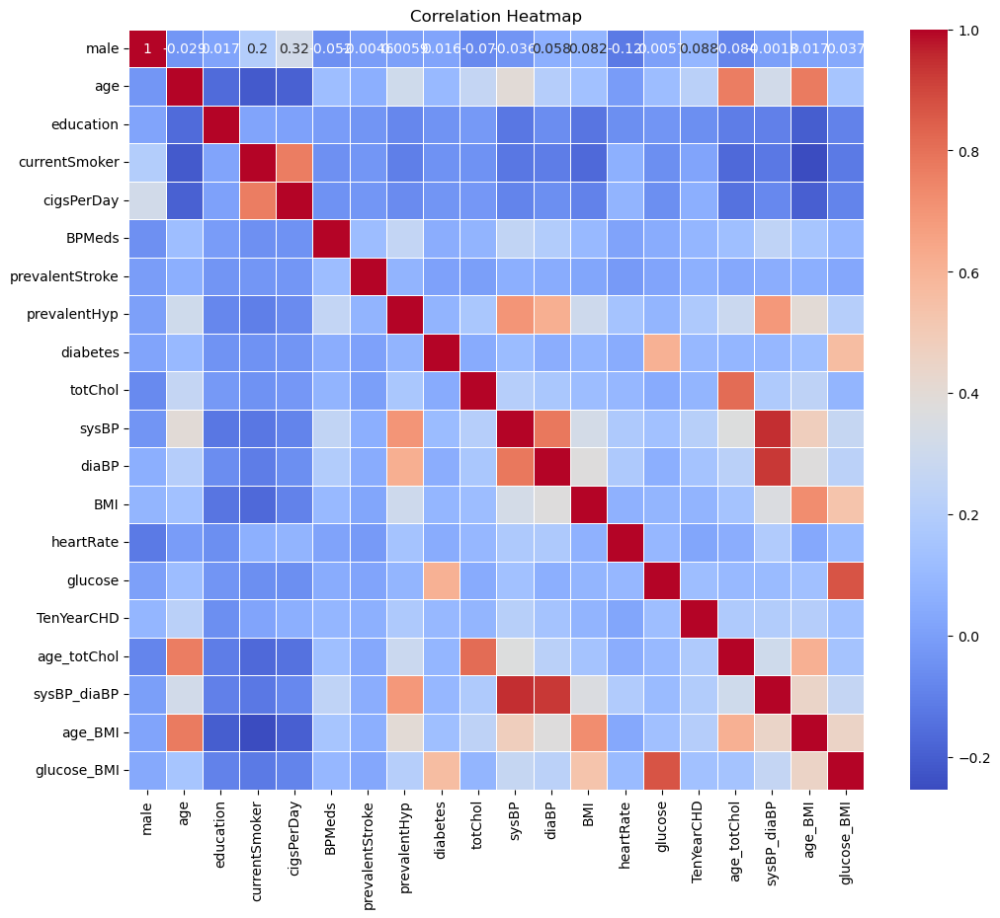

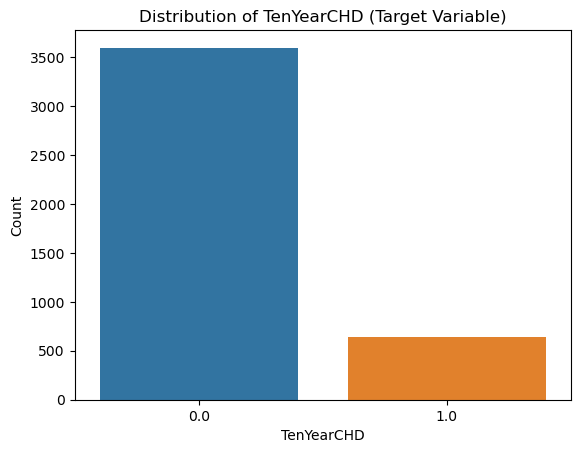

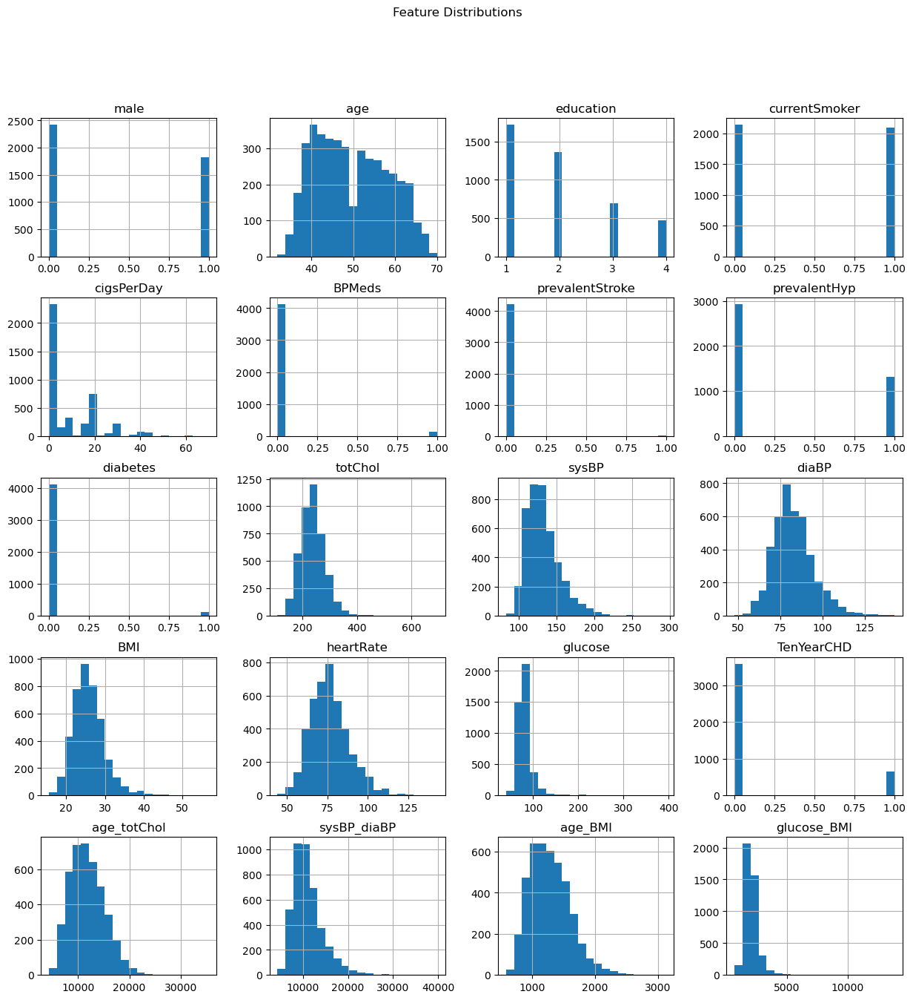

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

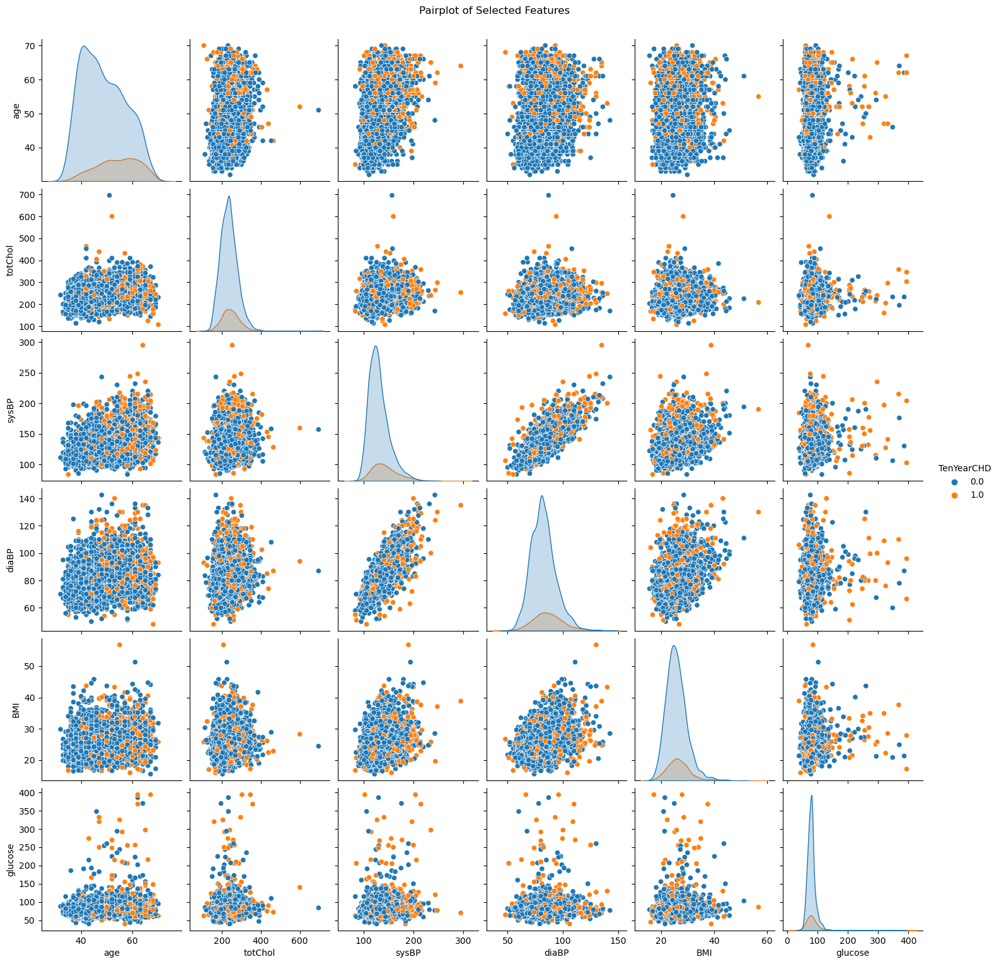


Tuning hyperparameters for XGBoost...
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}

Tuning hyperparameters for Logistic Regression...
Best parameters for Logistic Regression: {'C': 100, 'solver': 'lbfgs'}

Tuning hyperparameters for Random Forest...
Best parameters for Random Forest: {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 200}

Tuning hyperparameters for SVM...
Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Tuning hyperparameters for KNN...
Best parameters for KNN: {'n_neighbors': 5, 'weights': 'distance'}

Tuning hyperparameters for Naive Bayes...

Tuning hyperparameters for Decision Tree...
Best parameters for Decision Tree: {'max_depth': 10, 'min_samples_split': 10}
False Positive Rate for XGBoost: 0.05

Model: XGBoost
Accuracy: 0.90
              precision    recall  f1-score   support

         0.0       0.88      0.95      0.91       745
         1.0       0.94      0.86      0.90       694

    accuracy       

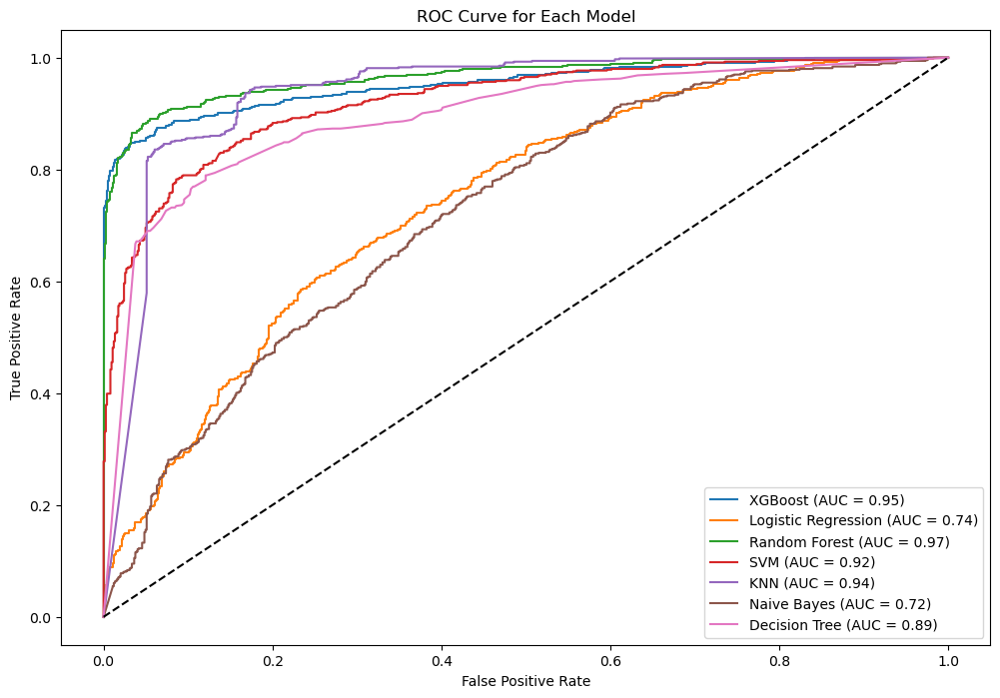

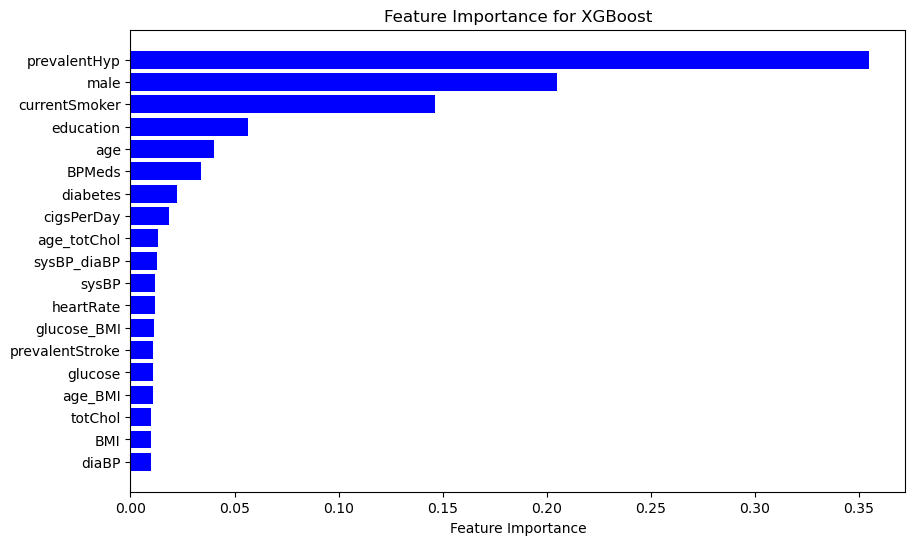

Top features for XGBoost:prevalentHyp     0.354543
male             0.205068
currentSmoker    0.146202
education        0.056338
age              0.040331
dtype: float32


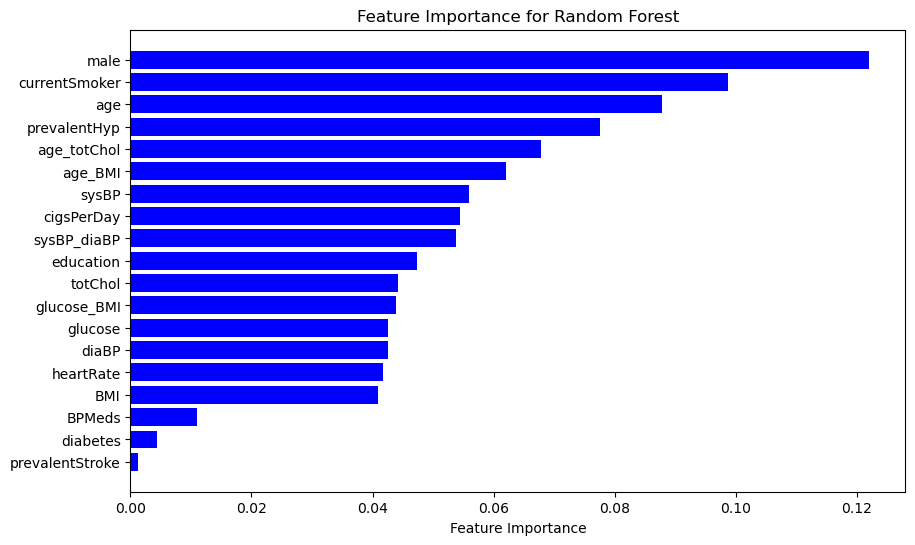

Top features for Random Forest:male             0.121983
currentSmoker    0.098721
age              0.087888
prevalentHyp     0.077531
age_totChol      0.067908
dtype: float64


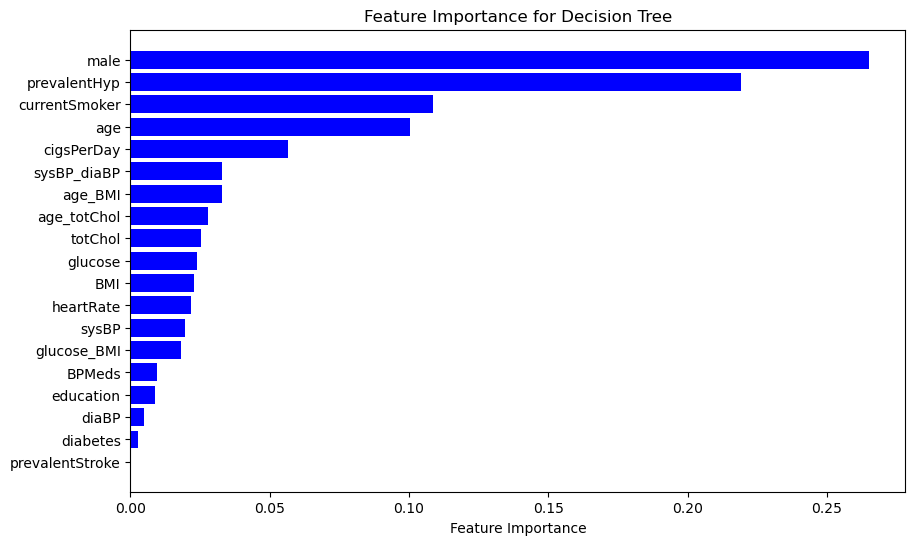

Top features for Decision Tree:male             0.264957
prevalentHyp     0.219012
currentSmoker    0.108481
age              0.100235
cigsPerDay       0.056525
dtype: float64

The best model is: Random Forest with AUC Score: 0.9661644392008201 and Accuracy: 0.92

Explaining the best model: Random Forest


100%|===================| 2876/2878 [01:29<00:00]        

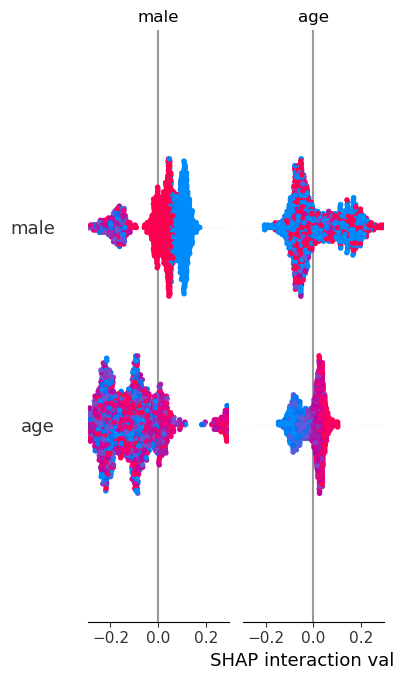

TypeError: dependence_legacy() got multiple values for argument 'shap_values'

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE
import shap
from xgboost import XGBClassifier

# Step 1: Load the dataset
df = pd.read_csv('framingham.csv')

# Step 2: Data Preprocessing
# Handling missing values
imputer = SimpleImputer(strategy='mean')
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Encoding categorical variables
le = LabelEncoder()
for column in df_imputed.select_dtypes(include='object').columns:
    df_imputed[column] = le.fit_transform(df_imputed[column])

# Step 3: Feature Engineering
# Creating interaction features
df_imputed['age_totChol'] = df_imputed['age'] * df_imputed['totChol']
df_imputed['sysBP_diaBP'] = df_imputed['sysBP'] * df_imputed['diaBP']
df_imputed['age_BMI'] = df_imputed['age'] * df_imputed['BMI']
df_imputed['glucose_BMI'] = df_imputed['glucose'] * df_imputed['BMI']

X = df_imputed.drop(columns=['TenYearCHD'])
y = df_imputed['TenYearCHD']

# Step 4: Balancing the Dataset
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 5: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 6: Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 7: Data Visualization
# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(df_imputed.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

# Distribution of target variable
sns.countplot(x='TenYearCHD', data=df_imputed)
plt.title('Distribution of TenYearCHD (Target Variable)')
plt.xlabel('TenYearCHD')
plt.ylabel('Count')
plt.show()

# Feature distributions
df_imputed.hist(figsize=(15, 15), bins=20)
plt.suptitle('Feature Distributions')
plt.show()

# Pairplot of selected features
selected_features = ['age', 'totChol', 'sysBP', 'diaBP', 'BMI', 'glucose', 'TenYearCHD']
sns.pairplot(df_imputed[selected_features], hue='TenYearCHD', diag_kind='kde')
plt.suptitle('Pairplot of Selected Features', y=1.02)
plt.show()

# Step 8: Model Training and Hyperparameter Tuning
models = {
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(probability=True),
    'KNN': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'Decision Tree': DecisionTreeClassifier()
}

param_grids = {
    'Logistic Regression': {'C': [0.1, 1, 10, 100], 'solver': ['liblinear', 'lbfgs']},
    'Random Forest': {'n_estimators': [100, 200, 300], 'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]},
    'SVM': {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']},
    'KNN': {'n_neighbors': [3, 5, 7, 9], 'weights': ['uniform', 'distance']},
    'XGBoost': {'n_estimators': [100, 200, 300], 'max_depth': [3, 5, 7], 'learning_rate': [0.01, 0.1, 0.2]},
    'Decision Tree': {'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]}
}

best_models = {}

for model_name, model in models.items():
    print(f"\nTuning hyperparameters for {model_name}...")
    if model_name in param_grids:
        grid_search = GridSearchCV(model, param_grids[model_name], cv=5, scoring='roc_auc', n_jobs=-1)
        grid_search.fit(X_train_scaled, y_train)
        best_model = grid_search.best_estimator_
        best_models[model_name] = best_model
        print(f"Best parameters for {model_name}: {grid_search.best_params_}")
    else:
        model.fit(X_train_scaled, y_train)
        best_models[model_name] = model

# Step 9: Model Evaluation
feature_importances = {}
model_auc_scores = {}
model_accuracies = {}

plt.figure(figsize=(12, 8))
for model_name, model in best_models.items():
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, 'predict_proba') else None
    accuracy = accuracy_score(y_test, y_pred)
    model_accuracies[model_name] = accuracy
    
    # Calculate false positives and true negatives
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    false_positive_rate = fp / (fp + tn)
    print(f"False Positive Rate for {model_name}: {false_positive_rate:.2f}")
    
    print(f"\nModel: {model_name}")
    print(f"Accuracy: {accuracy:.2f}")
    print(classification_report(y_test, y_pred))
    if y_pred_proba is not None:
        auc_score = roc_auc_score(y_test, y_pred_proba)
        model_auc_scores[model_name] = auc_score
        print(f"ROC AUC Score: {auc_score}")
        
        # Plotting ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc_score:.2f})')
    
    # Store feature importances for tree-based models
    if model_name in ['Random Forest', 'Decision Tree', 'XGBoost']:
        feature_importances[model_name] = model.feature_importances_

# Plotting the ROC curves for all models
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Model')
plt.legend(loc='lower right')
plt.show()

# Step 10: Feature Importance Visualization
for model_name, importances in feature_importances.items():
    plt.figure(figsize=(10, 6))
    sorted_idx = np.argsort(importances)
    plt.barh(X.columns[sorted_idx], importances[sorted_idx], color='b', align='center')
    plt.xlabel('Feature Importance')
    plt.title(f'Feature Importance for {model_name}')
    plt.show()

    # Print top features
    top_features = pd.Series(importances, index=X.columns).sort_values(ascending=False)
    print(f"Top features for {model_name}:{top_features.head(5)}")

# Step 11: Model Selection
# Select the best model based on the highest AUC score
best_model_name = max(model_auc_scores, key=model_auc_scores.get)
best_model = best_models[best_model_name]
print(f"\nThe best model is: {best_model_name} with AUC Score: {model_auc_scores[best_model_name]} and Accuracy: {model_accuracies[best_model_name]:.2f}")

# Step 12: Model Interpretability using SHAP
print(f"\nExplaining the best model: {best_model_name}")
if best_model_name in ['Random Forest', 'Logistic Regression', 'Decision Tree', 'XGBoost']:
    explainer = shap.Explainer(best_model, X_train_scaled)
    shap_values = explainer(X_test_scaled, check_additivity=False)
    
    # Summary plot
    shap.summary_plot(shap_values, X_test, feature_names=X.columns)
    
    # Dependence plot for the top feature
    top_feature = np.argmax(np.abs(shap_values.values).mean(axis=0))
    shap.dependence_plot(top_feature, X_test, shap_values=shap_values, feature_names=X.columns)
    
    # Visualize SHAP values for individual predictions
    for i in range(3):  # Visualizing SHAP values for the first three test samples
        shap.force_plot(explainer.expected_value, shap_values[i].values, X_test.iloc[i], feature_names=X.columns, matplotlib=True)
else:
    print(f"SHAP is not supported for the model {best_model_name}.")

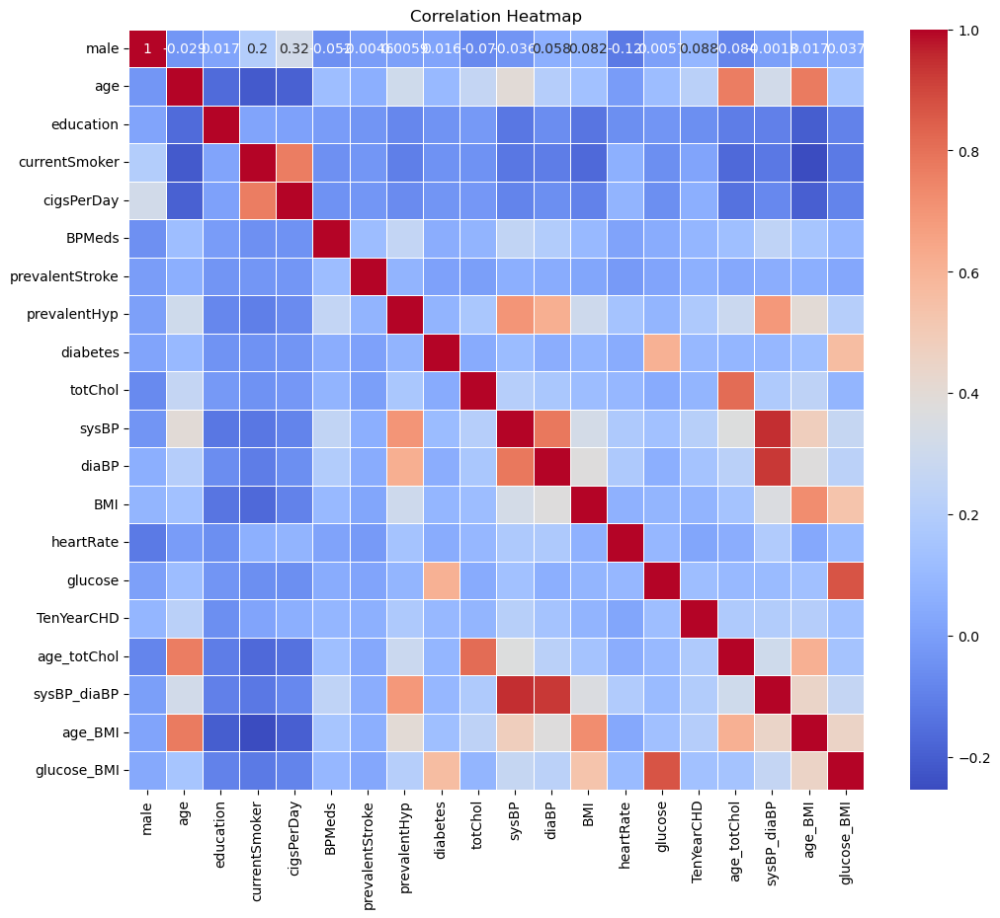

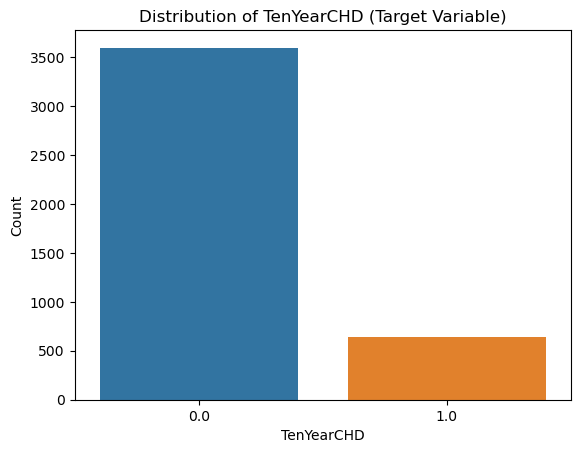

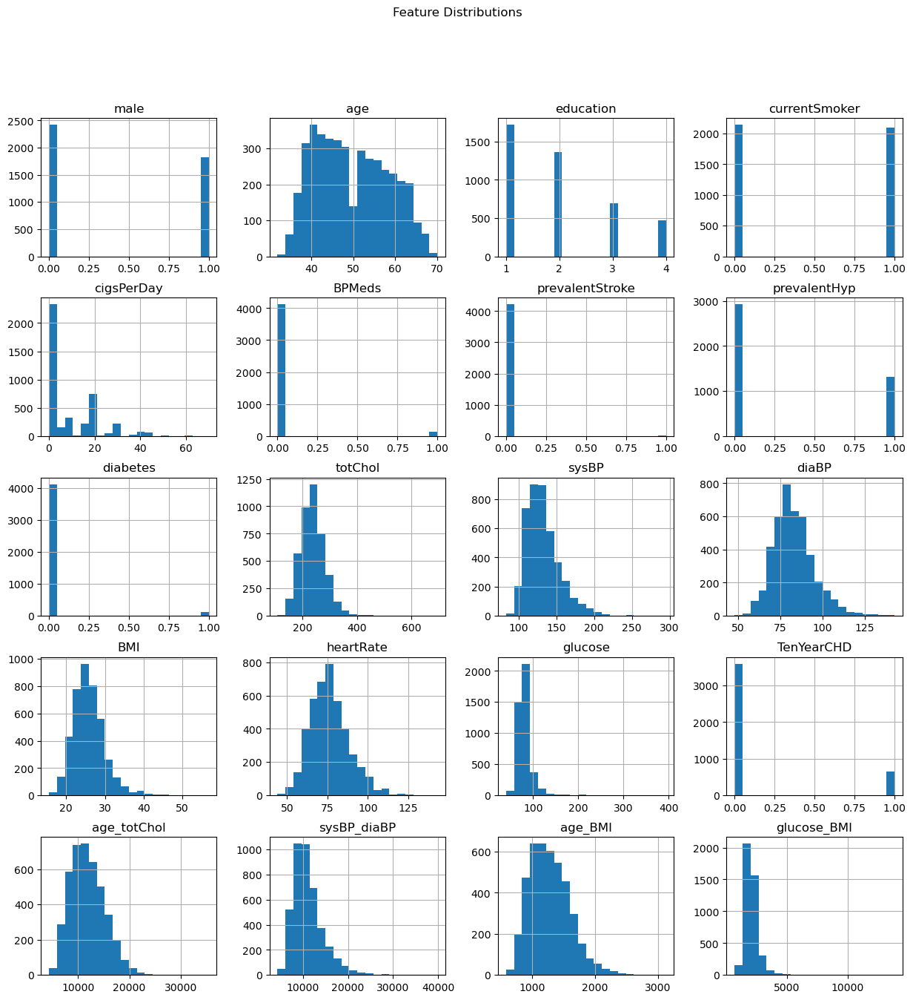

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

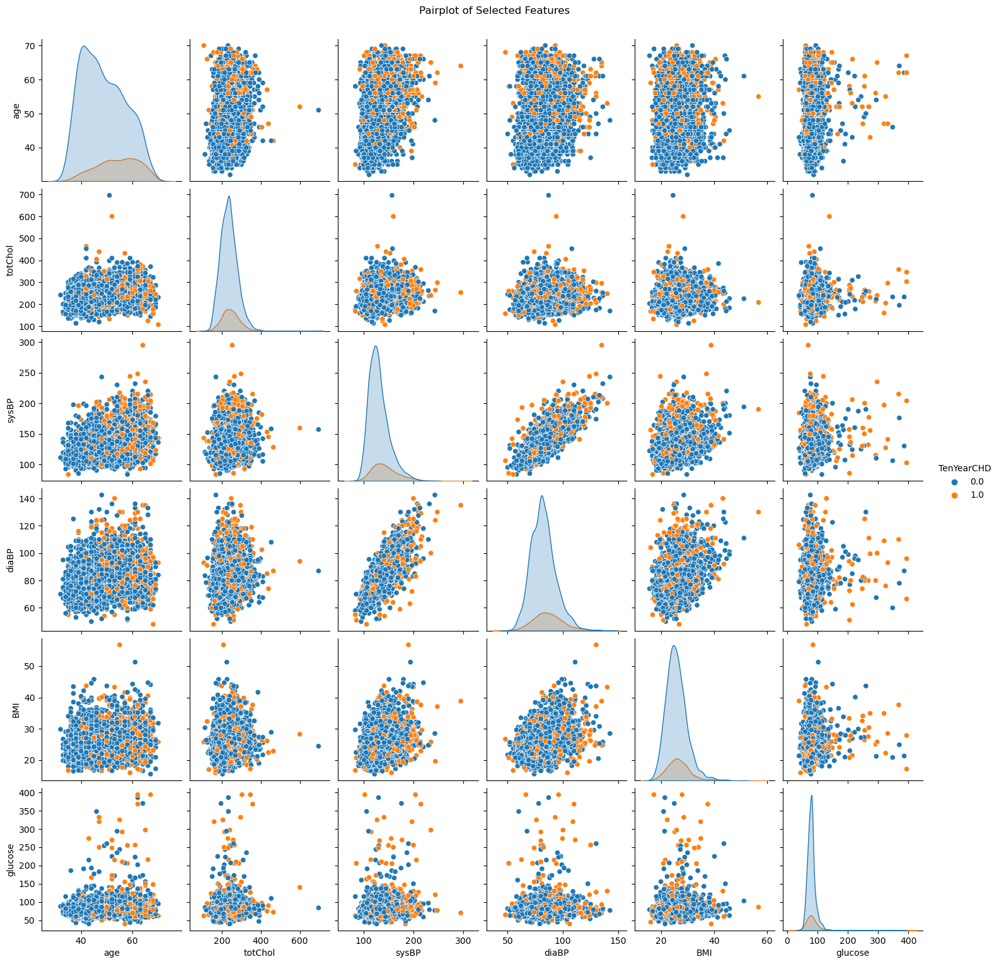


Tuning hyperparameters for XGBoost...
Best parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300}

Tuning hyperparameters for Logistic Regression...
Best parameters for Logistic Regression: {'C': 10, 'solver': 'lbfgs'}

Tuning hyperparameters for Random Forest...
Best parameters for Random Forest: {'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 300}

Tuning hyperparameters for SVM...
Best parameters for SVM: {'C': 10, 'kernel': 'rbf'}

Tuning hyperparameters for KNN...
Best parameters for KNN: {'n_neighbors': 5, 'weights': 'distance'}

Tuning hyperparameters for Naive Bayes...

Tuning hyperparameters for Decision Tree...
Best parameters for Decision Tree: {'max_depth': 10, 'min_samples_split': 10}
Evaluating Model Metrics After Applying SMOTE with Tomek Links for Balancing
False Negative Rate for XGBoost: 0.15
False Positive Rate for XGBoost: 0.05

Model: XGBoost
Accuracy: 0.90
              precision    recall  f1-score   support

         0.0  

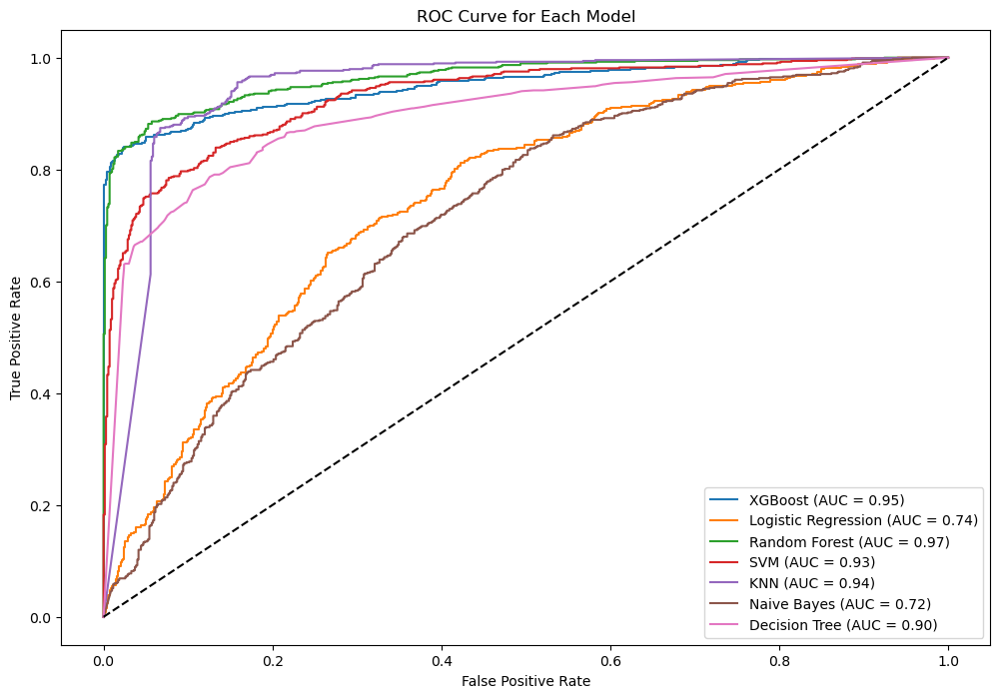

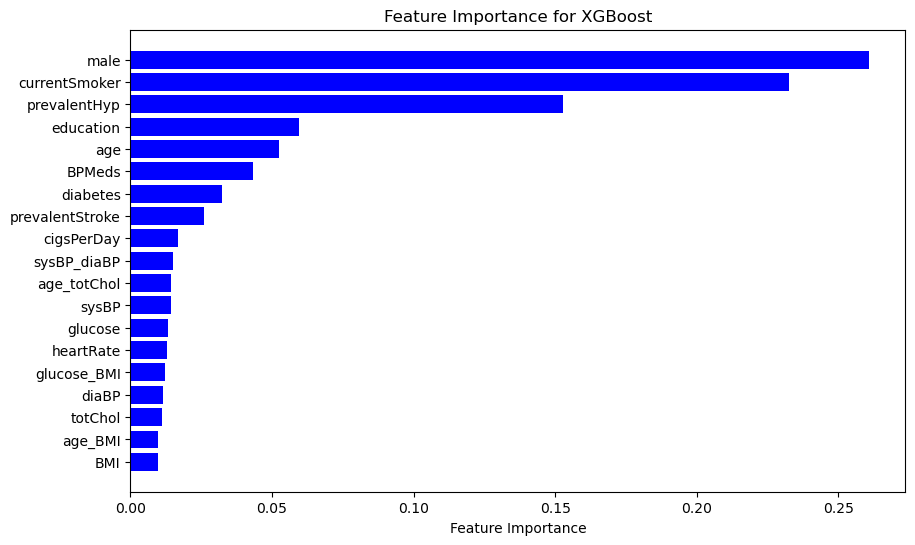

Top features for XGBoost:male             0.260623
currentSmoker    0.232355
prevalentHyp     0.152761
education        0.059429
age              0.052347
dtype: float32


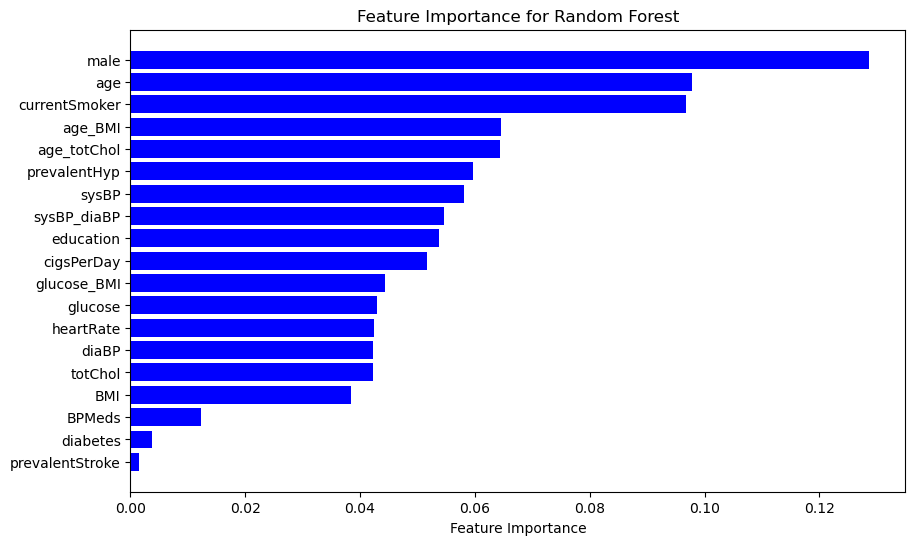

Top features for Random Forest:male             0.128565
age              0.097875
currentSmoker    0.096760
age_BMI          0.064482
age_totChol      0.064443
dtype: float64


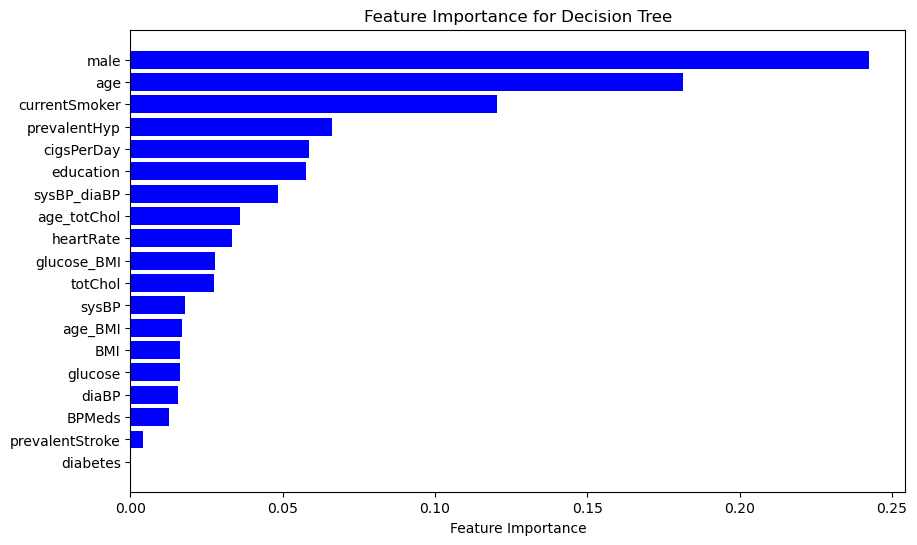

Top features for Decision Tree:male             0.242372
age              0.181599
currentSmoker    0.120266
prevalentHyp     0.066152
cigsPerDay       0.058665
dtype: float64

The best model is: Random Forest with AUC Score: 0.965184448281903 and Accuracy: 0.91

Explaining the best model: Random Forest


 99%|===================| 2751/2770 [01:58<00:00]        

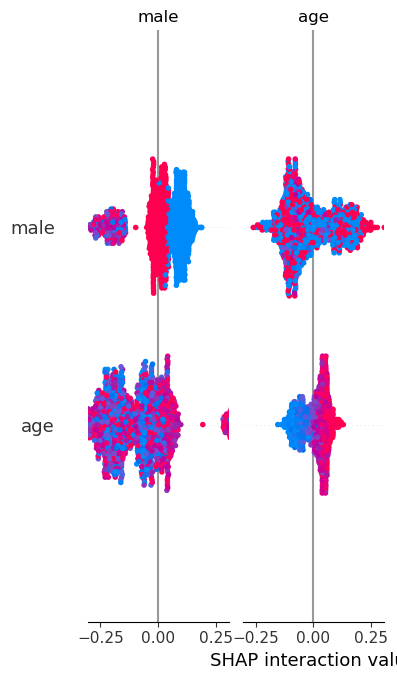

TypeError: dependence_legacy() got multiple values for argument 'shap_values'

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE
import shap
from xgboost import XGBClassifier

# Step 1: Load the dataset
df = pd.read_csv('framingham.csv')

# Step 2: Data Preprocessing
# Handling missing values
imputer = SimpleImputer(strategy='mean')
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Encoding categorical variables
le = LabelEncoder()
for column in df_imputed.select_dtypes(include='object').columns:
    df_imputed[column] = le.fit_transform(df_imputed[column])

# Step 3: Feature Engineering
# Creating interaction features
df_imputed['age_totChol'] = df_imputed['age'] * df_imputed['totChol']
df_imputed['sysBP_diaBP'] = df_imputed['sysBP'] * df_imputed['diaBP']
df_imputed['age_BMI'] = df_imputed['age'] * df_imputed['BMI']
df_imputed['glucose_BMI'] = df_imputed['glucose'] * df_imputed['BMI']

X = df_imputed.drop(columns=['TenYearCHD'])
y = df_imputed['TenYearCHD']

from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek

# Step 4: Balancing the Dataset
smote_tomek = SMOTETomek(random_state=42)
X_resampled, y_resampled = smote_tomek.fit_resample(X, y)

# Step 5: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 6: Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 7: Data Visualization
# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(df_imputed.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

# Distribution of target variable
sns.countplot(x='TenYearCHD', data=df_imputed)
plt.title('Distribution of TenYearCHD (Target Variable)')
plt.xlabel('TenYearCHD')
plt.ylabel('Count')
plt.show()

# Feature distributions
df_imputed.hist(figsize=(15, 15), bins=20)
plt.suptitle('Feature Distributions')
plt.show()

# Pairplot of selected features
selected_features = ['age', 'totChol', 'sysBP', 'diaBP', 'BMI', 'glucose', 'TenYearCHD']
sns.pairplot(df_imputed[selected_features], hue='TenYearCHD', diag_kind='kde')
plt.suptitle('Pairplot of Selected Features', y=1.02)
plt.show()

# Step 8: Model Training and Hyperparameter Tuning
models = {
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(probability=True),
    'KNN': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'Decision Tree': DecisionTreeClassifier()
}

param_grids = {
    'Logistic Regression': {'C': [0.1, 1, 10, 100], 'solver': ['liblinear', 'lbfgs']},
    'Random Forest': {'n_estimators': [100, 200, 300], 'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]},
    'SVM': {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']},
    'KNN': {'n_neighbors': [3, 5, 7, 9], 'weights': ['uniform', 'distance']},
    'XGBoost': {'n_estimators': [100, 200, 300], 'max_depth': [3, 5, 7], 'learning_rate': [0.01, 0.1, 0.2]},
    'Decision Tree': {'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]}
}

best_models = {}

for model_name, model in models.items():
    print(f"\nTuning hyperparameters for {model_name}...")
    if model_name in param_grids:
        grid_search = GridSearchCV(model, param_grids[model_name], cv=5, scoring='roc_auc', n_jobs=-1)
        grid_search.fit(X_train_scaled, y_train)
        best_model = grid_search.best_estimator_
        best_models[model_name] = best_model
        print(f"Best parameters for {model_name}: {grid_search.best_params_}")
    else:
        model.fit(X_train_scaled, y_train)
        best_models[model_name] = model

print("Evaluating Model Metrics After Applying SMOTE with Tomek Links for Balancing")
model_false_negative_rates = {}
model_accuracies = {}
model_auc_scores = {}
feature_importances = {}

plt.figure(figsize=(12, 8))

for model_name, model in best_models.items():
    y_pred = model.predict(X_test_scaled)
    y_pred_proba = model.predict_proba(X_test_scaled)[:, 1] if hasattr(model, 'predict_proba') else None
    accuracy = accuracy_score(y_test, y_pred)
    model_accuracies[model_name] = accuracy

    # Calculate false negatives and true positives
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    false_negative_rate = fn / (fn + tp)
    model_false_negative_rates[model_name] = false_negative_rate
    print(f"False Negative Rate for {model_name}: {false_negative_rate:.2f}")

    # Calculate false positives and true negatives
    false_positive_rate = fp / (fp + tn)
    print(f"False Positive Rate for {model_name}: {false_positive_rate:.2f}")

    print(f"\nModel: {model_name}")
    print(f"Accuracy: {accuracy:.2f}")
    print(classification_report(y_test, y_pred))
    if y_pred_proba is not None:
        auc_score = roc_auc_score(y_test, y_pred_proba)
        model_auc_scores[model_name] = auc_score
        print(f"ROC AUC Score: {auc_score}")

        # Plotting ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc_score:.2f})')

    # Store feature importances for tree-based models
    if model_name in ['Random Forest', 'Decision Tree', 'XGBoost']:
        feature_importances[model_name] = model.feature_importances_

# Plotting the ROC curves for all models
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Model')
plt.legend(loc='lower right')
plt.show()

# Step 10: Feature Importance Visualization
for model_name, importances in feature_importances.items():
    plt.figure(figsize=(10, 6))
    sorted_idx = np.argsort(importances)
    plt.barh(X.columns[sorted_idx], importances[sorted_idx], color='b', align='center')
    plt.xlabel('Feature Importance')
    plt.title(f'Feature Importance for {model_name}')
    plt.show()

    # Print top features
    top_features = pd.Series(importances, index=X.columns).sort_values(ascending=False)
    print(f"Top features for {model_name}:{top_features.head(5)}")

# Step 11: Model Selection
# Select the best model based on the highest AUC score
best_model_name = max(model_auc_scores, key=model_auc_scores.get)
best_model = best_models[best_model_name]
print(f"\nThe best model is: {best_model_name} with AUC Score: {model_auc_scores[best_model_name]} and Accuracy: {model_accuracies[best_model_name]:.2f}")

# Step 12: Model Interpretability using SHAP
print(f"\nExplaining the best model: {best_model_name}")
if best_model_name in ['Random Forest', 'Logistic Regression', 'Decision Tree', 'XGBoost']:
    explainer = shap.Explainer(best_model, X_train_scaled)
    shap_values = explainer(X_test_scaled, check_additivity=False)

    # Summary plot
    shap.summary_plot(shap_values, X_test, feature_names=X.columns)

    # Dependence plot for the top feature
    top_feature = np.argmax(np.abs(shap_values.values).mean(axis=0))
    shap.dependence_plot(top_feature, X_test, shap_values=shap_values, feature_names=X.columns)

    # Visualize SHAP values for individual predictions
    for i in range(3):  # Visualizing SHAP values for the first three test samples
        shap.force_plot(explainer.expected_value, shap_values[i].values, X_test.iloc[i], feature_names=X.columns, matplotlib=True)
else:
    print(f"SHAP is not supported for the model {best_model_name}.")